In [157]:
# Importando los módulos que necesitaremos
import pandas as pd

from datetime import date as Date
from datetime import datetime as DateTime
from datetime import timedelta as TimeDelta
import numpy as np
from epiweeks import Year

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import colors

import seaborn as sns

from prophet import Prophet

# Configurando los estilos de los gráficos
plt.ioff()
sns.set_context('talk')
sns.set_style("whitegrid")

## Adquisición de Datos

In [158]:
df = pd.read_csv('data/positivos_covid.csv', sep=';')
df.head()

,FECHA_CORTE,UUID,DEPARTAMENTO,PROVINCIA,DISTRITO,METODODX,EDAD,SEXO,FECHA_RESULTADO
0,20210621,7320cabdc1aaca6c59014cae76a134e6,LIMA REGION,HUAROCHIRI,SAN ANTONIO,PR,41.0,FEMENINO,20200526.0
1,20210621,566af4276cbe9359abe93f9aa86396c3,LIMA REGION,HUARAL,HUARAL,PR,51.0,FEMENINO,20200529.0
2,20210621,7f33fb1baeeb90ad470e0661cb82b7f3,APURIMAC,ABANCAY,ABANCAY,PR,32.0,FEMENINO,20200425.0
3,20210621,5d45a6324866fecf2cb9fe7312ae4bdc,APURIMAC,ABANCAY,ABANCAY,PR,34.0,FEMENINO,20200429.0
4,20210621,0f0d7ed4937b26cb01a3dd3b4776a0bb,APURIMAC,ANDAHUAYLAS,ANDAHUAYLAS,PR,40.0,FEMENINO,20200426.0


In [159]:
# Generando las semanas epidemológicas
weeks_2020 = list(Year(2020).iterweeks())
weeks_2021 = list(Year(2021).iterweeks())
weeks_all = weeks_2020 + weeks_2021

In [160]:
# Definiendo constantes para las conversiones
AVG_O2_FLOW_RATE_SEVERE = 10 # L/min
AVG_O2_FLOW_RATE_CRITICAL = 30 # L/min
LITERS_TO_CUBICMETERS = 1/1000 # m3/L

## Transformación de Datos

In [161]:
# Nos deshacemos de los registros que no tienen fecha
df.dropna(inplace=True)

In [162]:
# Reunimos todo lo correspondiente al departamento de Lima
df['DEPARTAMENTO'].replace({'LIMA REGION': 'LIMA', 'CALLAO': 'LIMA'},inplace=True) 

In [163]:
# Generamos la columna FECHA
df['FECHA'] = pd.to_datetime(df['FECHA_RESULTADO'], infer_datetime_format=False, format='%Y%m%d')

In [164]:
# Contamos los casos por semana
def generate_weekly_dataframe(source_df):
    source_df.sort_values('FECHA',  ascending=True, inplace=True)

    first_date = source_df['FECHA'].iloc[0]
    last_date = source_df['FECHA'].iloc[-1]

    data = []

    for i in np.arange(0,len(weeks_all)):
        start_date = np.datetime64(weeks_all[i].startdate())
        end_date = np.datetime64(weeks_all[i].enddate())

        if(start_date < first_date):
            continue

        if(end_date > last_date):
            break

        y = len(source_df[(source_df['FECHA'] >= start_date) & (source_df['FECHA'] <= end_date)])

        item = {
            'ds': end_date,
            'y': max(1,y),
        }

        data.append(item)

    return pd.DataFrame(data, columns=['ds','y'])

## Visualización de Datos

In [165]:
FUTURE_PERIODS = 2

In [166]:
def calculate_expected_os(source_name, source_df, filename, show_plot=False):
    data = generate_weekly_dataframe(source_df)

    m = Prophet(growth='linear',seasonality_mode='multiplicative',interval_width=0.85,daily_seasonality=False,weekly_seasonality=False,yearly_seasonality=False)
    m.add_seasonality(name='part_covid_wave', period=120, fourier_order=2)
    m.add_seasonality(name='covid_wave',period=240, fourier_order=5)
    m.fit(data)
    future = m.make_future_dataframe(periods=FUTURE_PERIODS, freq='W-SAT')
    forecast = m.predict(future)

    latests = forecast[['ds','yhat_lower', 'yhat', 'yhat_upper']].tail(FUTURE_PERIODS+1)

    # Forecast Visualization
    plt.clf()
    fig = m.plot(forecast)
    fig.set_size_inches(25, 10)
    plt.title(f'{source_name}: MODELO PREDICTIVO DE CASOS POSITIVOS POR COVID-19 AL {latests["ds"].iloc[-1]:%Y-%m-%d}')
    plt.ylim(0,forecast['yhat_upper'].max()*1.05)
    plt.xlim(forecast['ds'].min(),forecast['ds'].max())
    plt.ylabel('NÚMERO DE CASOS POSITIVOS')
    plt.xlabel(None)
    plt.axvline(x=data['ds'].iloc[-1],ls='--',color='#E81123')

    save_filename = f'dist/FORECAST_{filename}_AL_{latests["ds"].iloc[-1]:%Y-%m-%d}.png'
    plt.savefig('../' + save_filename, bbox_inches='tight')

    with open("../dist/md_model.txt", "a", encoding='utf-8') as f:
        f.write('![alt text]({} "{}")\n\n'.format(save_filename, source_name))

    if(show_plot):
        plt.show()

    plt.close(fig)

    # Plot Visualization
    y_lower = [data['y'].iloc[-1], latests['yhat_lower'].iloc[-2], latests['yhat_lower'].iloc[-1]]
    y_middle = [data['y'].iloc[-1], latests['yhat'].iloc[-2], latests['yhat'].iloc[-1]]
    y_upper = [data['y'].iloc[-1], latests['yhat_upper'].iloc[-2], latests['yhat_upper'].iloc[-1]]

    plt.clf()

    fig, axs = plt.subplots(figsize=(25,10))
    plt.figtext(0.1,0.95, f'{source_name}: ESTIMACIÓN DE CASOS POSITIVOS POR COVID-19 AL {latests["ds"].iloc[-1]:%Y-%m-%d}', ha='left', fontsize=24)
    plt.figtext(0.1,0.90, 'Rango de fechas de casos positivos: del {} al {}'.format(f'{data["ds"].iloc[0]:%Y-%m-%d}',f'{latests["ds"].iloc[-1]:%Y-%m-%d}'), ha='left', fontsize=20, color='#999')
    plt.figtext(0.9,0.01, """Fuente: https://www.datosabiertos.gob.pe/dataset/casos-positivos-por-covid-19-ministerio-de-salud-minsa
    Autor: https://malexandersalazar.github.io/, Moisés Alexander Salazar Vila, """ + f'{DateTime.now():%Y-%m-%d}', ha='right')

    formatter = mdates.DateFormatter("%Y-%m-%d")
    locator = mdates.DayLocator(interval=30)

    axs.xaxis.set_major_formatter(formatter)
    axs.xaxis.set_major_locator(locator)

    axs.plot(data['ds'], data['y'], color='#0086CD')
    axs.plot(latests['ds'], y_middle, color='r')

    axs.fill_between(list(latests['ds']), y_lower, y_upper, facecolor='#E81123', interpolate=True,alpha=0.27)
    axs.axvline(x=data['ds'].iloc[-FUTURE_PERIODS],ls='--',color='#E81123')

    axs.set_ylim(ymin=0)
    axs.set_xlim((data["ds"].iat[0],latests["ds"].iat[-1]))
    axs.set_ylabel('NÚMERO DE CASOS POSITIVOS')

    sns.despine(left=False, bottom=False)

    save_filename = f'dist/{filename}_AL_{latests["ds"].iloc[-1]:%Y-%m-%d}.png'
    plt.savefig('../' + save_filename, bbox_inches='tight')

    with open("../dist/md_forecast.txt", "a", encoding='utf-8') as f:
        f.write('![alt text]({} "{}")\n\n'.format(save_filename, source_name))

    if(show_plot):
        plt.show()

    plt.close(fig)

    recommended_cases = latests[-2:]['yhat'].sum()
    recommended_severe_cases = recommended_cases * 0.14
    recommended_critical_cases = recommended_cases * 0.05
    recommended_subtotal_severe = recommended_severe_cases * AVG_O2_FLOW_RATE_SEVERE * 60 # L/h
    recommended_subtotal_critical = recommended_critical_cases * AVG_O2_FLOW_RATE_CRITICAL * 60 # L/h

    ideal_cases = latests[-2:]['yhat_upper'].sum()
    ideal_severe_cases = ideal_cases * 0.14
    ideal_critical_cases = ideal_cases * 0.05
    ideal_subtotal_severe = ideal_severe_cases * AVG_O2_FLOW_RATE_SEVERE * 60 # L/h
    ideal_subtotal_critical = ideal_critical_cases * AVG_O2_FLOW_RATE_CRITICAL * 60 # L/h

    return (data["ds"].iloc[0],
    latests["ds"].iloc[-1],
    (recommended_subtotal_severe + recommended_subtotal_critical) * LITERS_TO_CUBICMETERS,
    (ideal_subtotal_severe + ideal_subtotal_critical) * LITERS_TO_CUBICMETERS,
    1 + ((latests['yhat'].iloc[-1] - latests['yhat'].iloc[-(FUTURE_PERIODS+1)]) / latests['yhat'].iloc[-(FUTURE_PERIODS+1)]),
    1 + ((latests['yhat_upper'].iloc[-1] - latests['yhat'].iloc[-(FUTURE_PERIODS+1)]) / latests['yhat'].iloc[-(FUTURE_PERIODS+1)])) # m3/h

In [167]:
def generate_bar_plot(area, case, data, date_range, show_plot=False, save_plot=True, save_name=None):
    ylabels = data['AREA']
    recommended = data['PROD. RECOMENDADA']
    ideal = data['PROD. IDEAL']

    plt.clf()

    # Creamos la figura, los ejes y agregamos la atribución
    fig, axs = plt.subplots(1,1, figsize=(20,20))
    plt.figtext(0.05,0.925, f'{area}: ESTIMACIÓN DE OXIGENO REQUERIDO POR {case} HACIA {date_range[1]:%Y-%m-%d}', ha='left', fontsize=24)
    plt.figtext(0.05,0.90, 'Rango de fechas de casos positivos: del {} al {}'.format(f'{date_range[0]:%Y-%m-%d}',f'{date_range[1]:%Y-%m-%d}'), ha='left', fontsize=20, color='#999')
    plt.figtext(0.9,0.05, """Fuente: https://www.datosabiertos.gob.pe/dataset/casos-positivos-por-covid-19-ministerio-de-salud-minsa
    Autor: https://malexandersalazar.github.io, Moisés Alexander Salazar Vila, """ + f'{DateTime.now():%Y-%m-%d}', ha='right')

    pos = np.arange(len(ylabels))

    plt.barh(pos, recommended, color='#E81123', label="RECOMENDADO (M3/H)")
    plt.barh(pos, ideal - recommended, left=recommended, color='g', label="OPTIMO (M3/H)")
    
    axs.set_yticks(pos)
    axs.set_yticklabels(ylabels)

    plt.xlabel('PRODUCCIÓN POR HORA DE OXÍGENO REQUERIDA (M3/H)')
    plt.legend()

    xlim_max = ideal.max() * 1.2
    plt.xlim(0,xlim_max)

    ### Calculamos y anotamos los valores correspondientes a cada barra
    for i in pos:
        axs.text(ideal[i] + (xlim_max * 0.01), len(pos) - 1.125 - i, '[' + str(round(recommended[i],2)) + ', ' + str(round(ideal[i],2)) +']')

    sns.despine(left=False, bottom=False)

    if save_plot:
        filename = f'dist/{area.replace(" ", "")}_{case}_AL_{date_range[1]:%Y-%m-%d}.png'
        plt.savefig("../" + filename, bbox_inches='tight')
        with open("../dist/md_forecast.txt", "a", encoding='utf-8') as f:
            f.write('![alt text]({} "{}")\n\n'.format(filename, area))

    if show_plot:
        plt.show()

    plt.close(fig)

<Figure size 432x288 with 0 Axes>

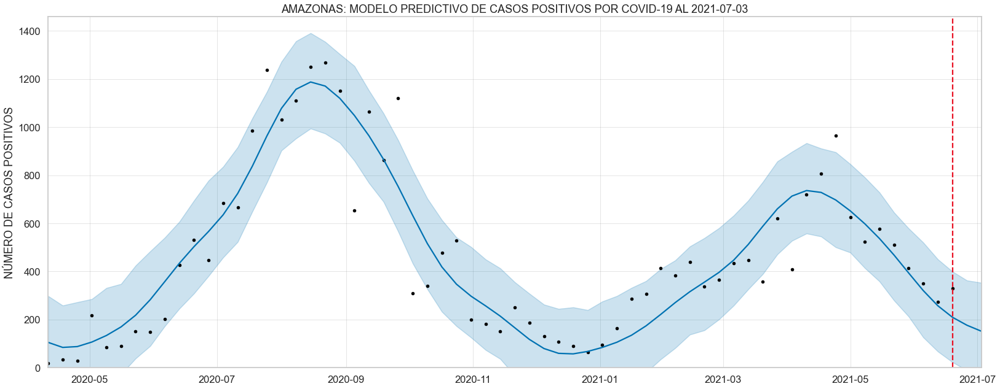

<Figure size 432x288 with 0 Axes>

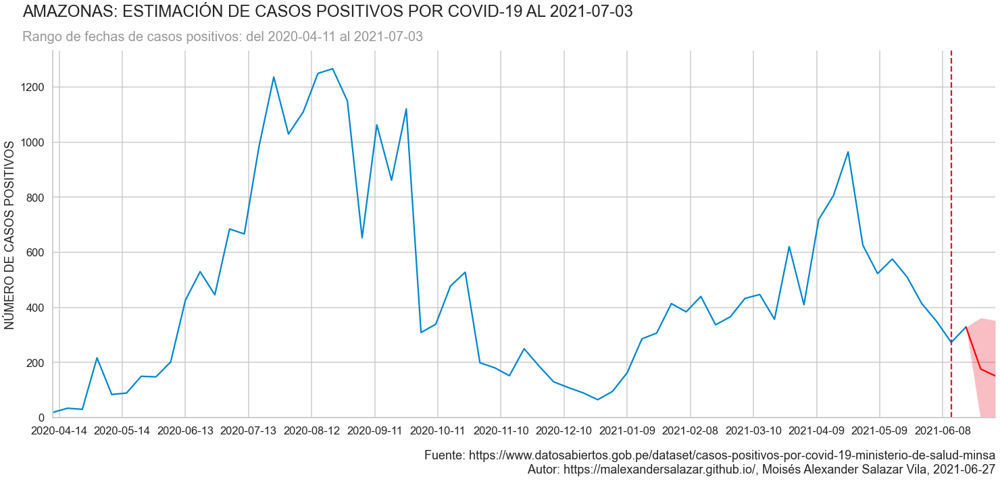

<Figure size 432x288 with 0 Axes>

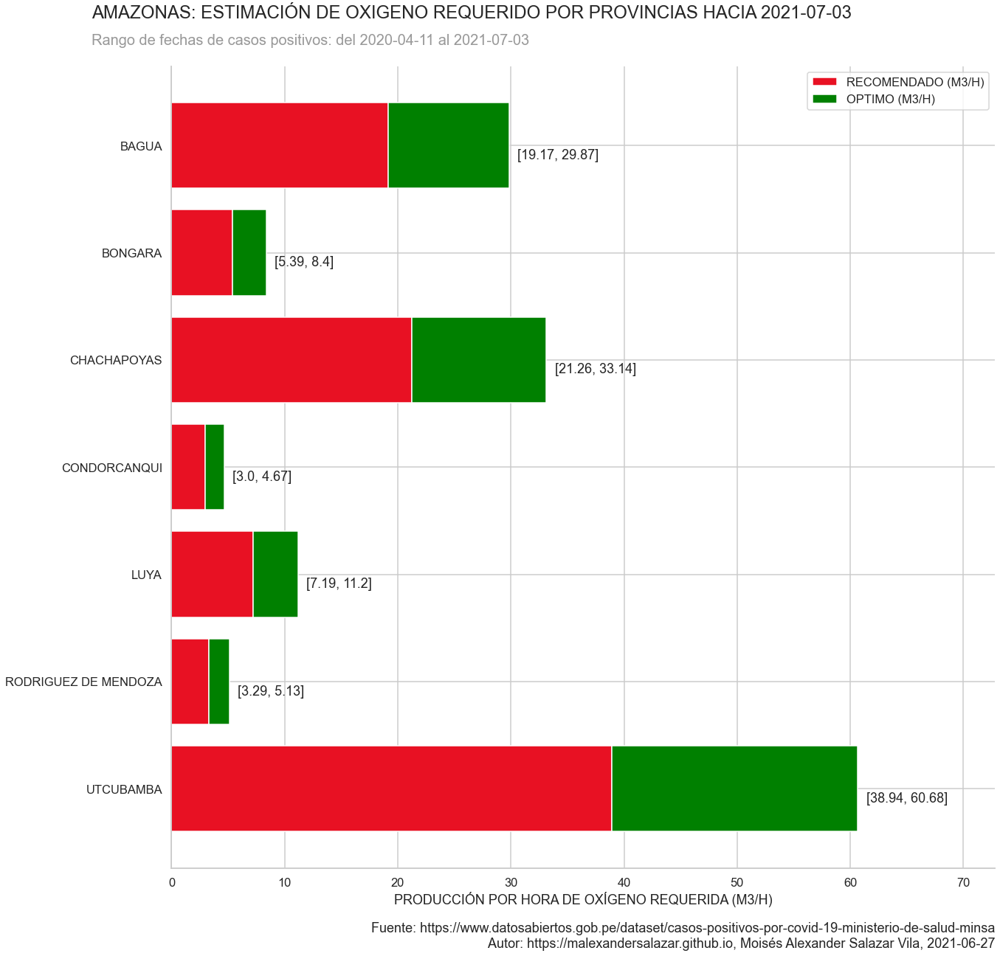

<Figure size 432x288 with 0 Axes>

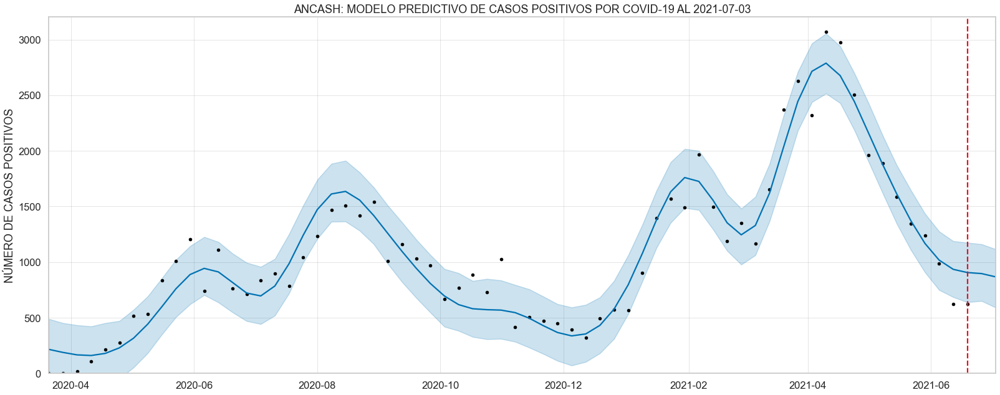

<Figure size 432x288 with 0 Axes>

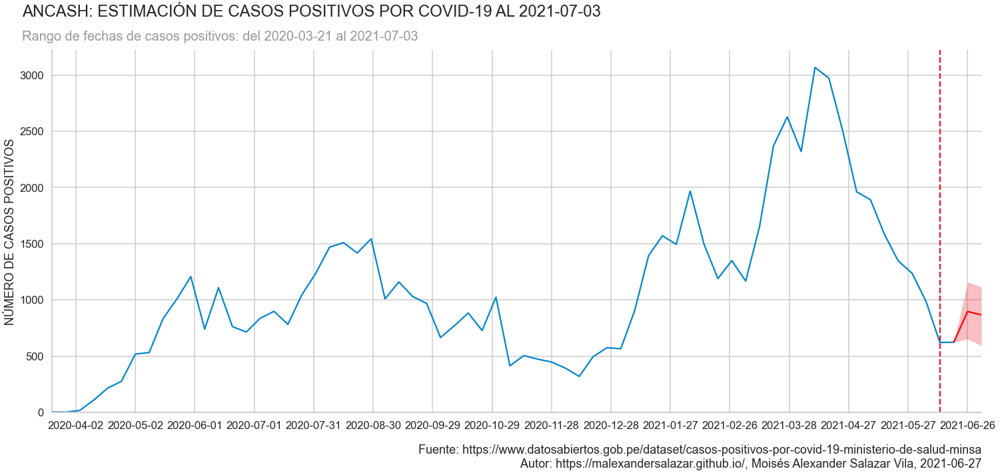

<Figure size 432x288 with 0 Axes>

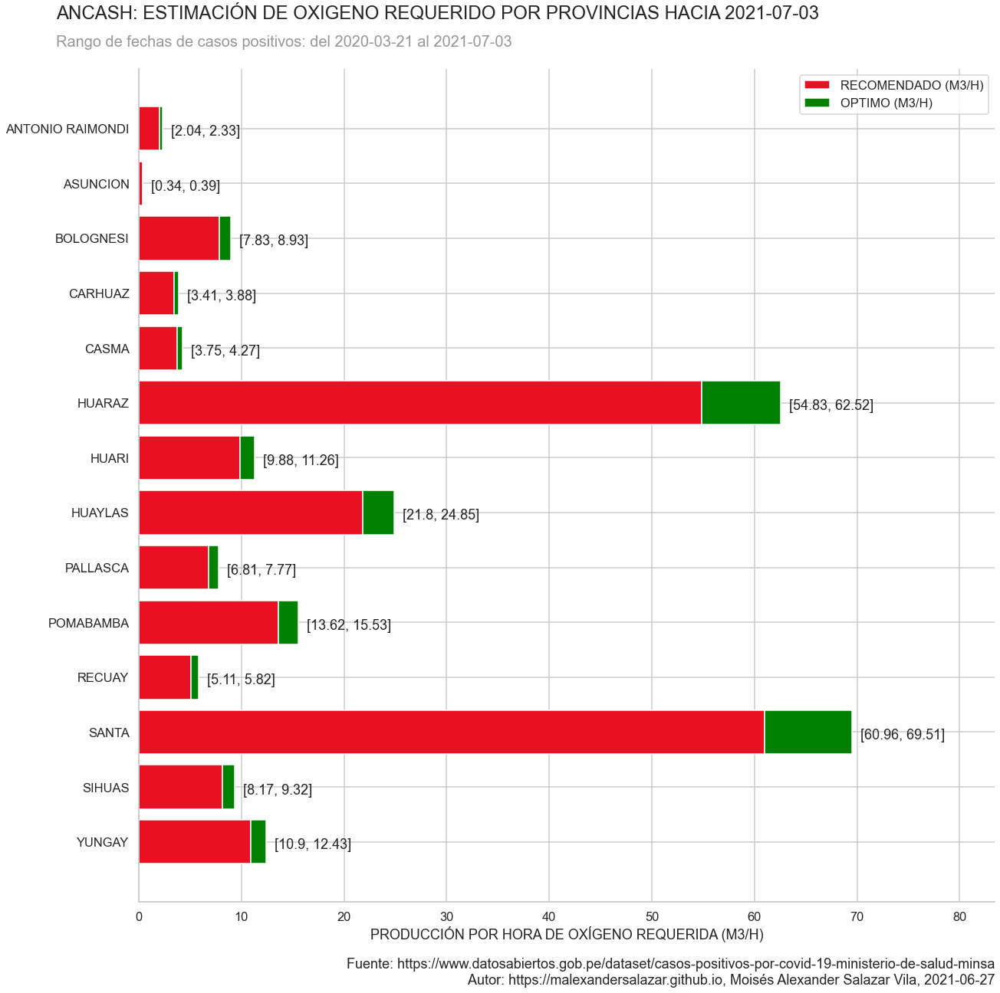

<Figure size 432x288 with 0 Axes>

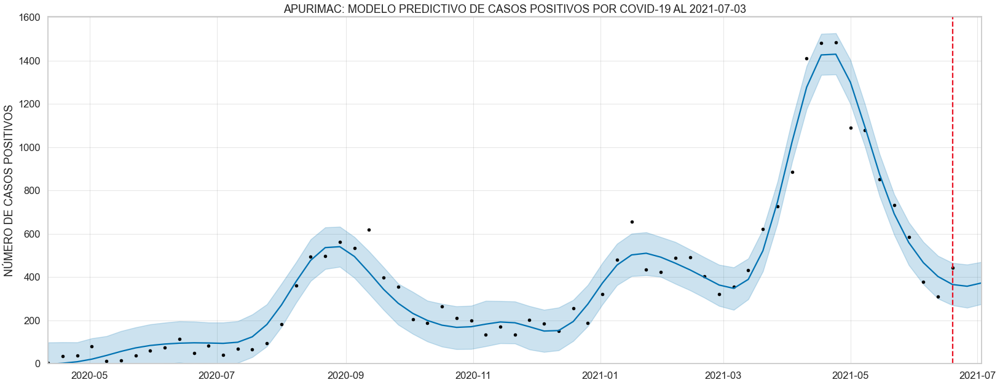

<Figure size 432x288 with 0 Axes>

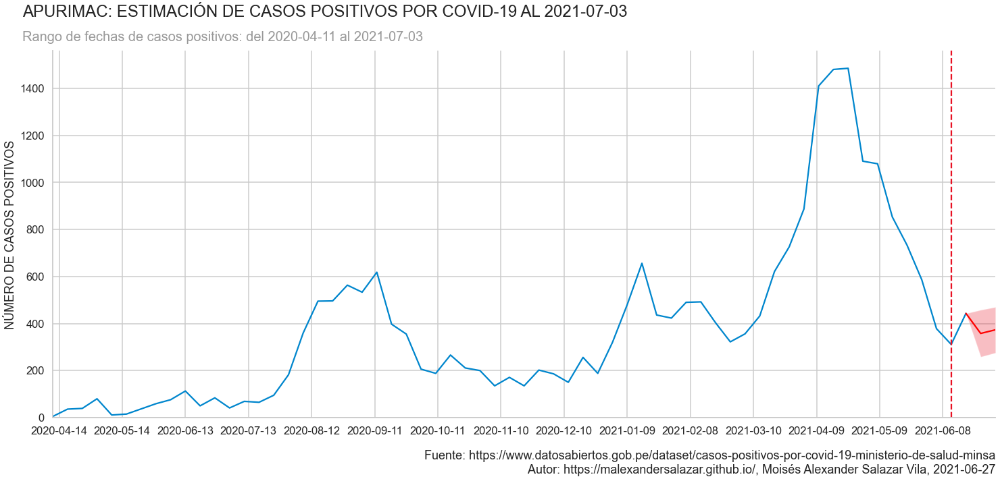

<Figure size 432x288 with 0 Axes>

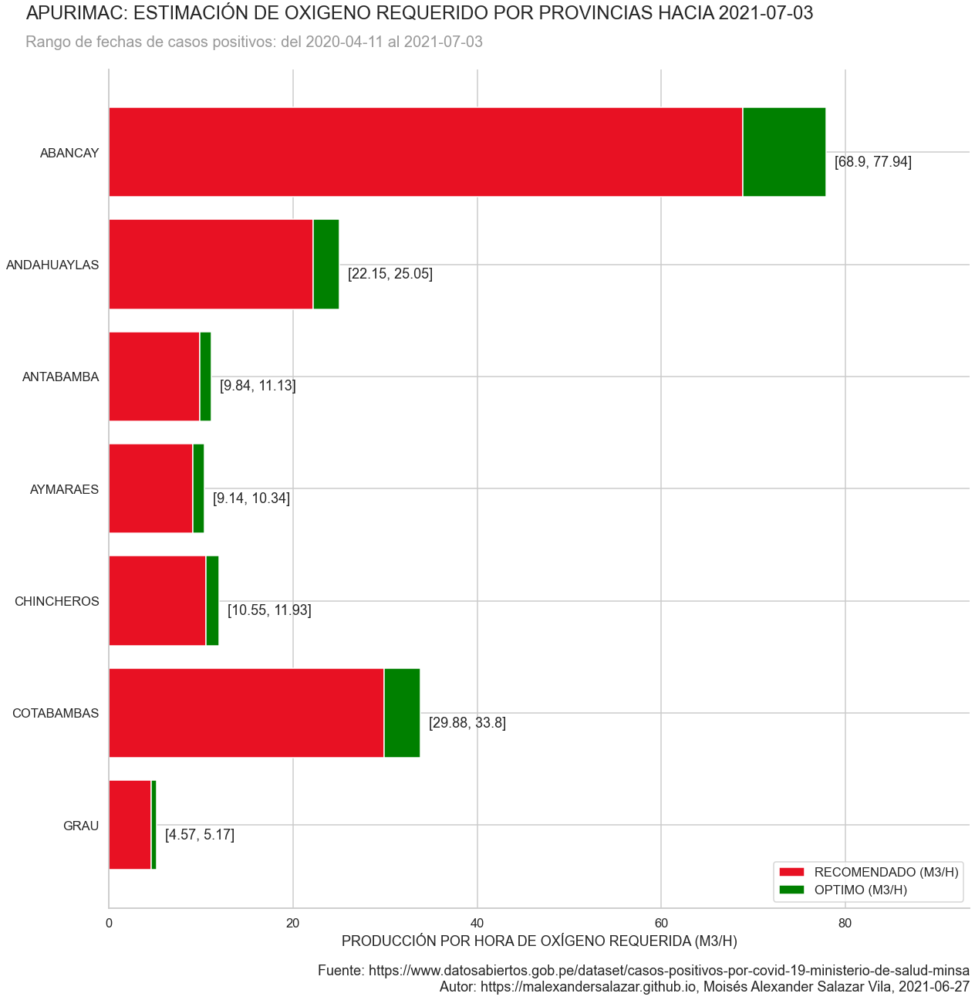

<Figure size 432x288 with 0 Axes>

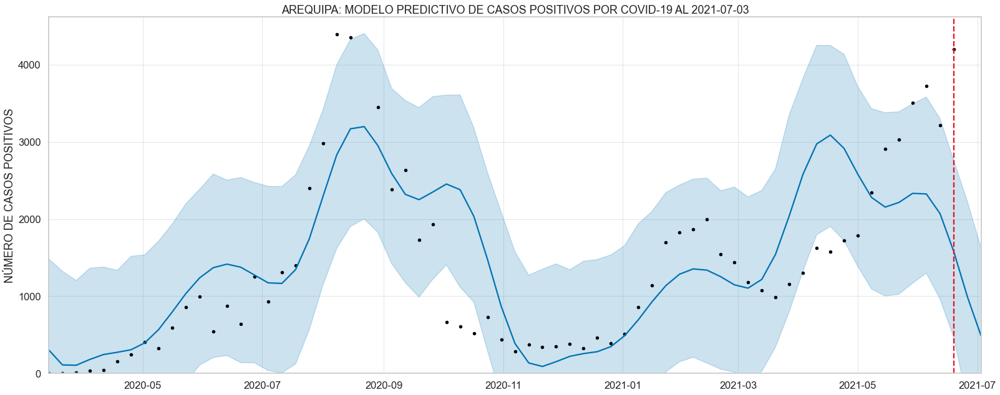

<Figure size 432x288 with 0 Axes>

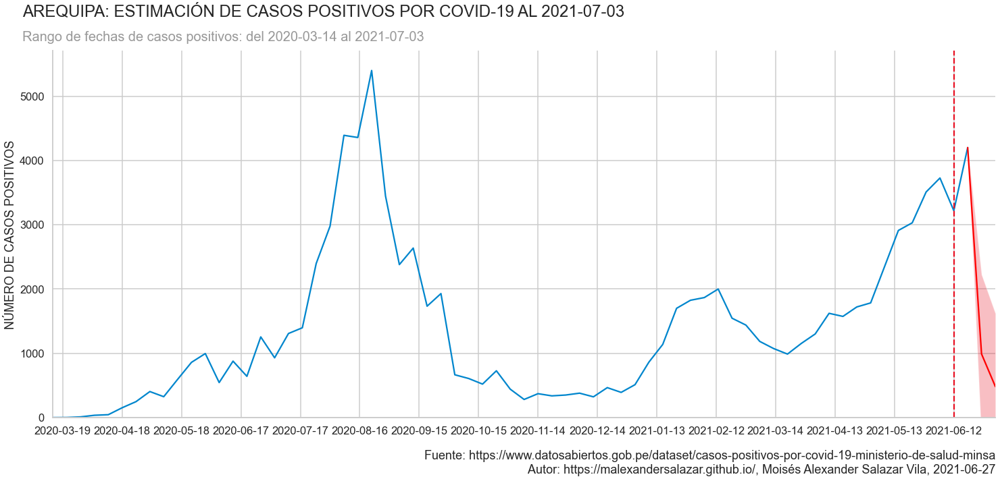

<Figure size 432x288 with 0 Axes>

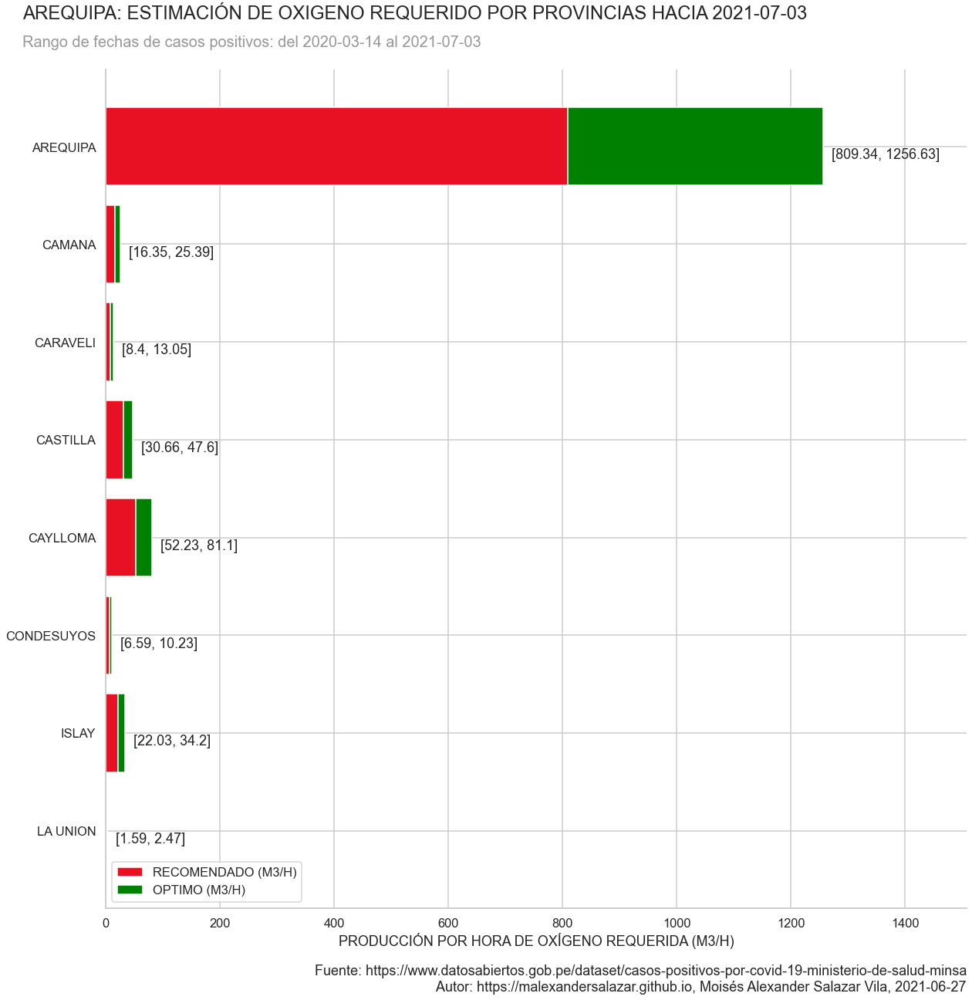

<Figure size 432x288 with 0 Axes>

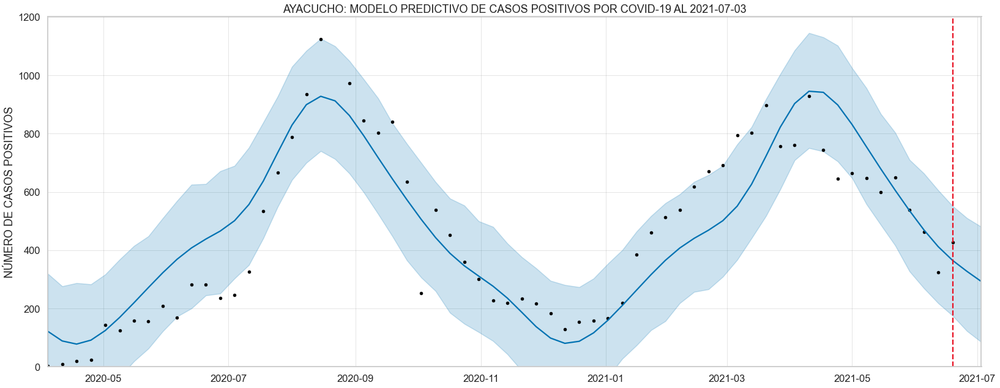

<Figure size 432x288 with 0 Axes>

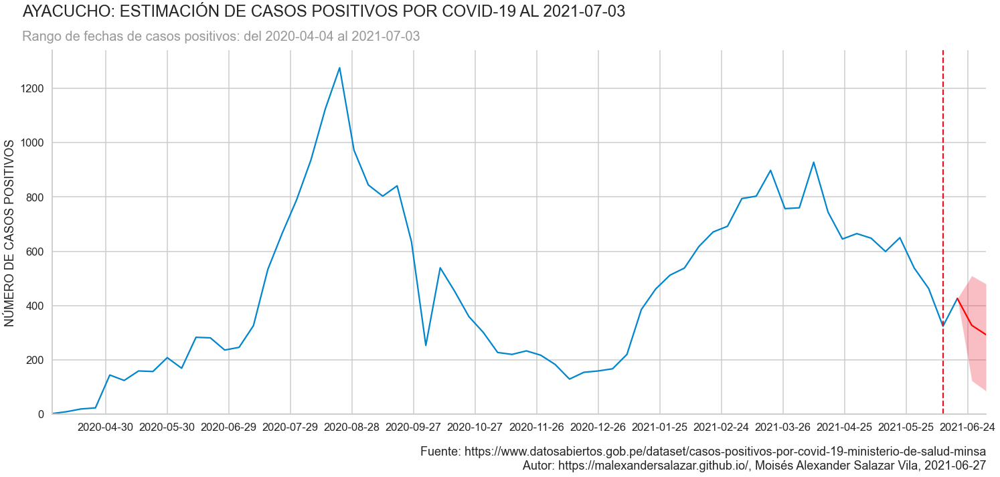

<Figure size 432x288 with 0 Axes>

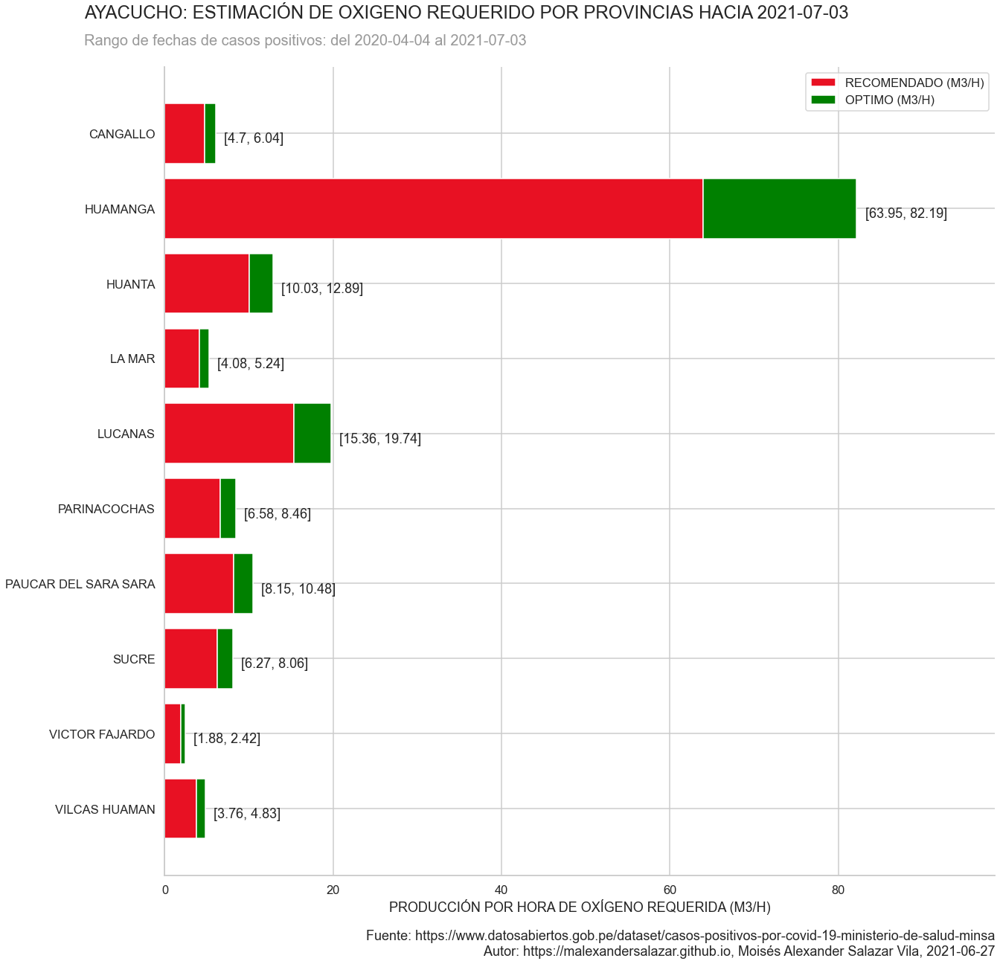

<Figure size 432x288 with 0 Axes>

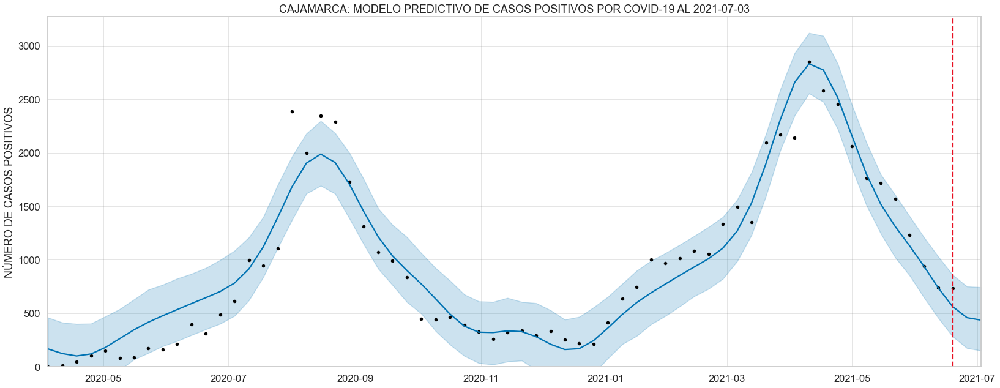

<Figure size 432x288 with 0 Axes>

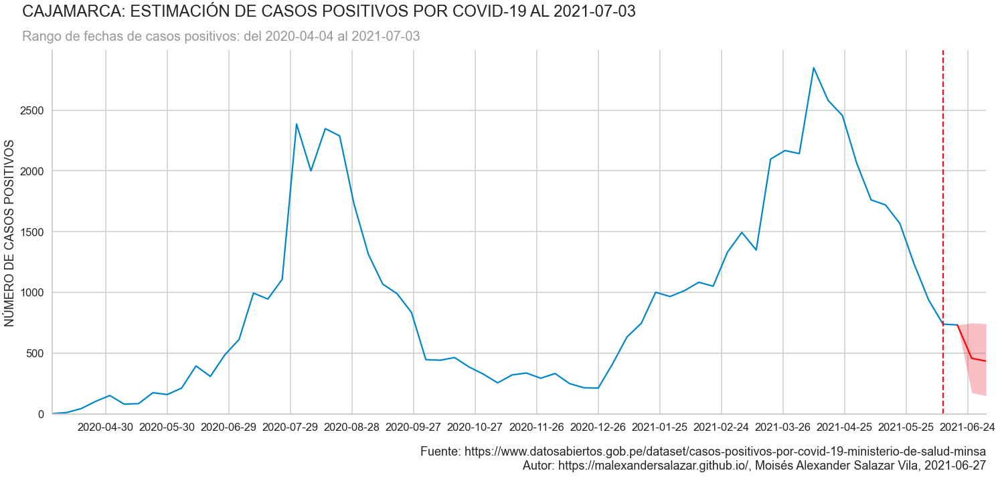

<Figure size 432x288 with 0 Axes>

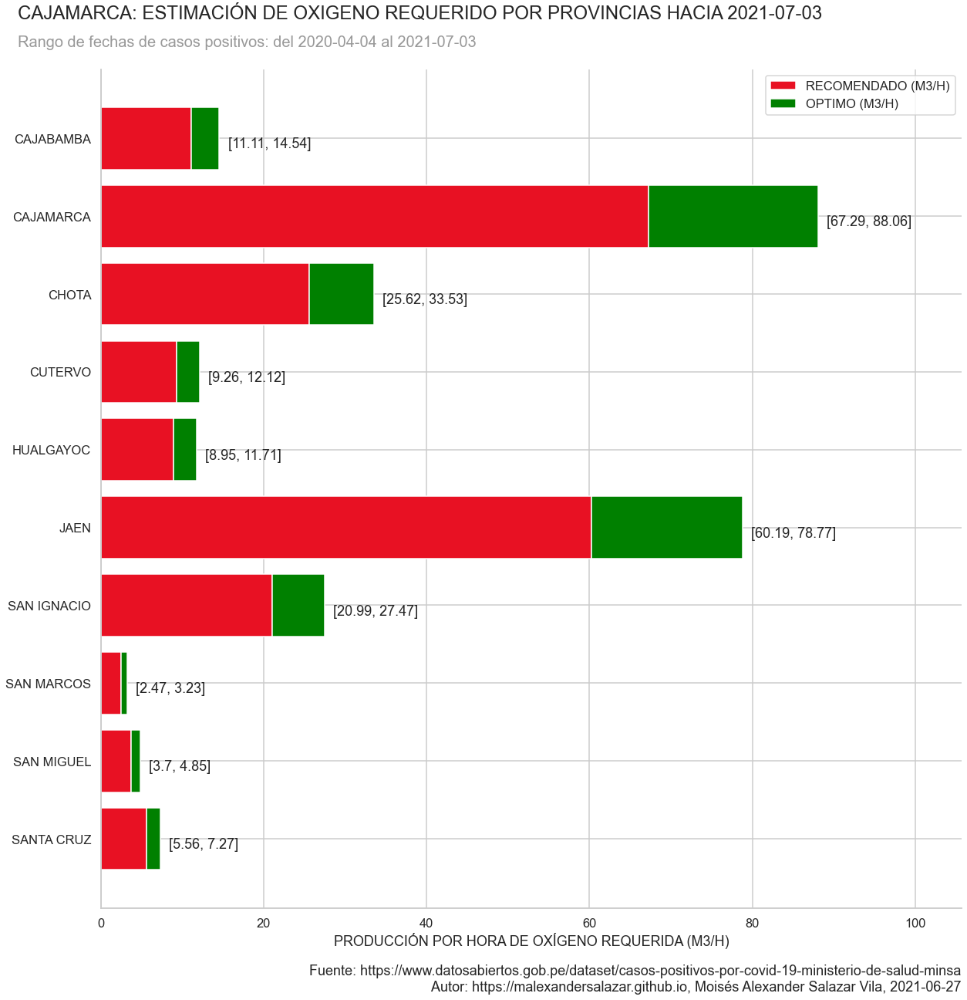

<Figure size 432x288 with 0 Axes>

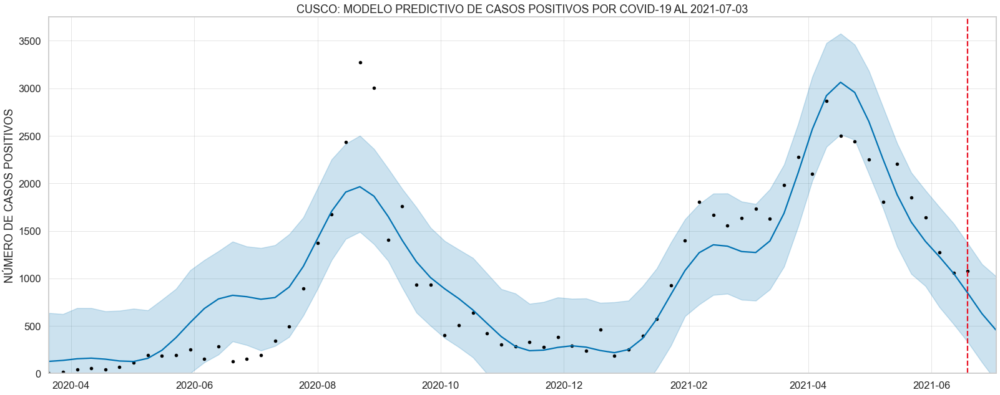

<Figure size 432x288 with 0 Axes>

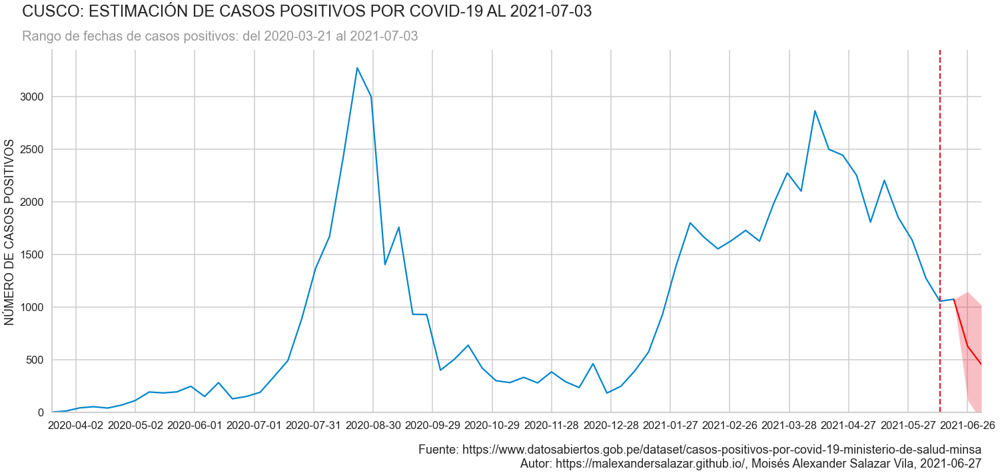

<Figure size 432x288 with 0 Axes>

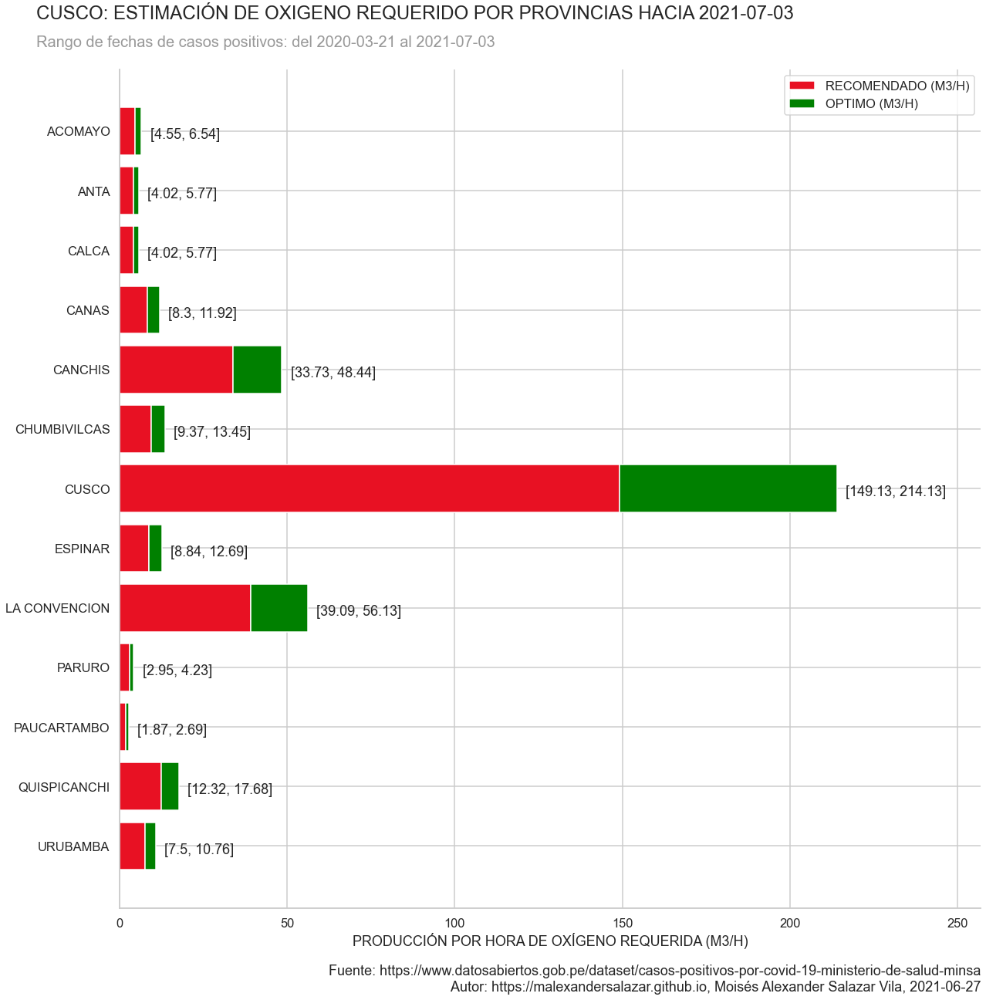

<Figure size 432x288 with 0 Axes>

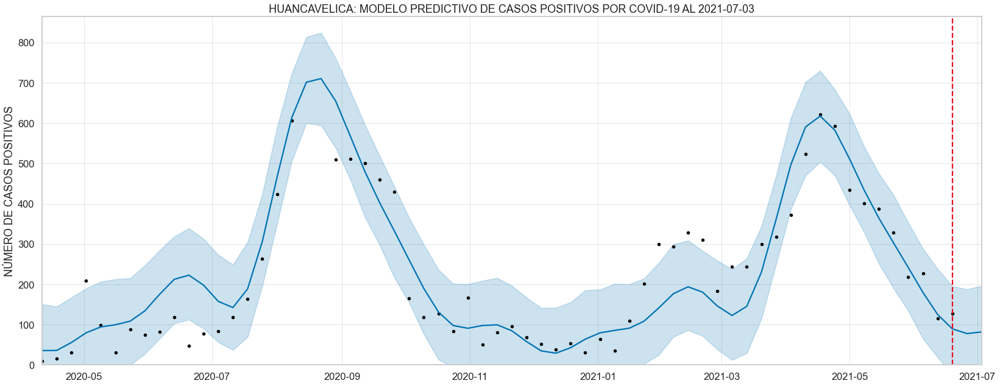

<Figure size 432x288 with 0 Axes>

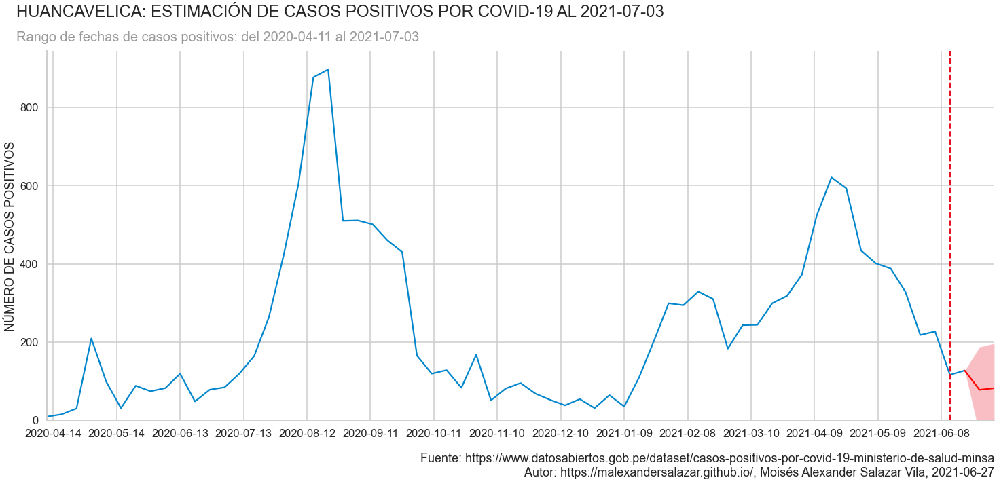

<Figure size 432x288 with 0 Axes>

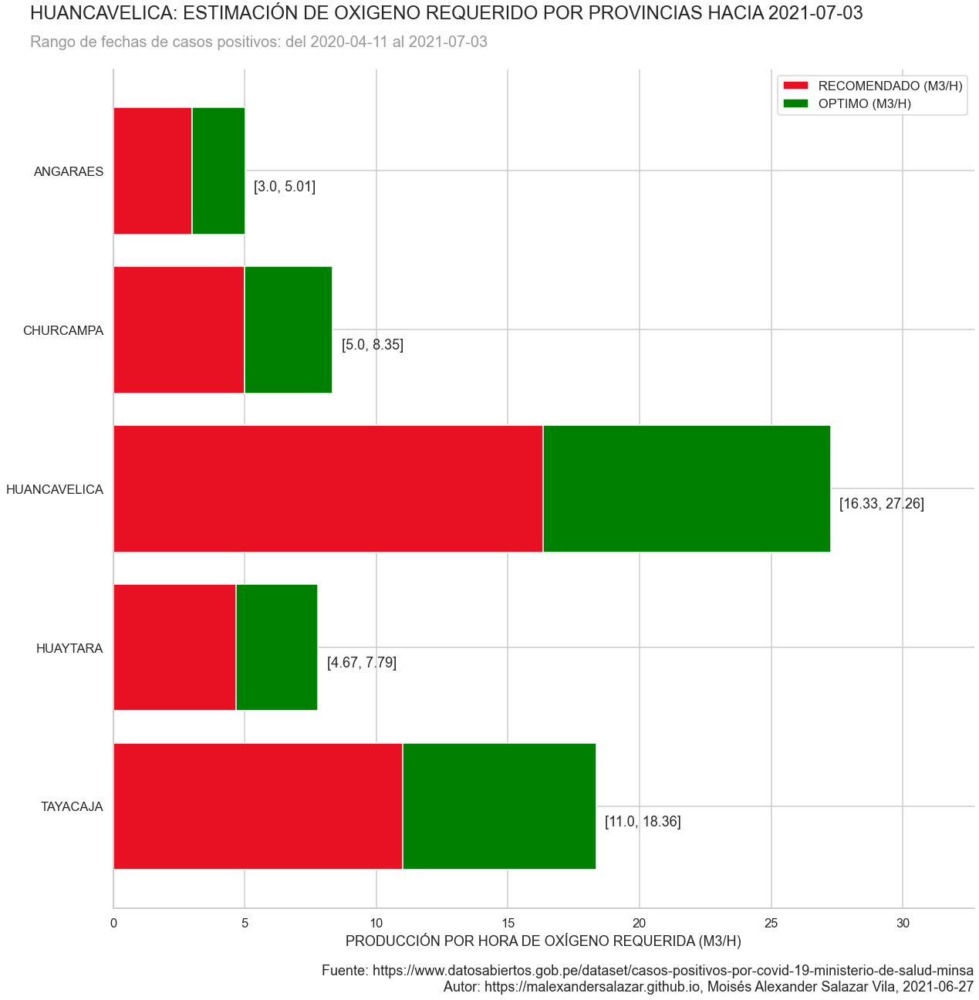

<Figure size 432x288 with 0 Axes>

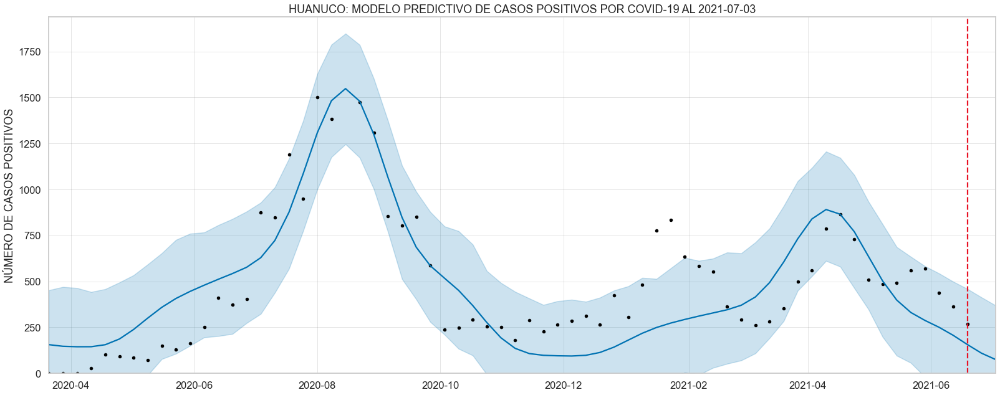

<Figure size 432x288 with 0 Axes>

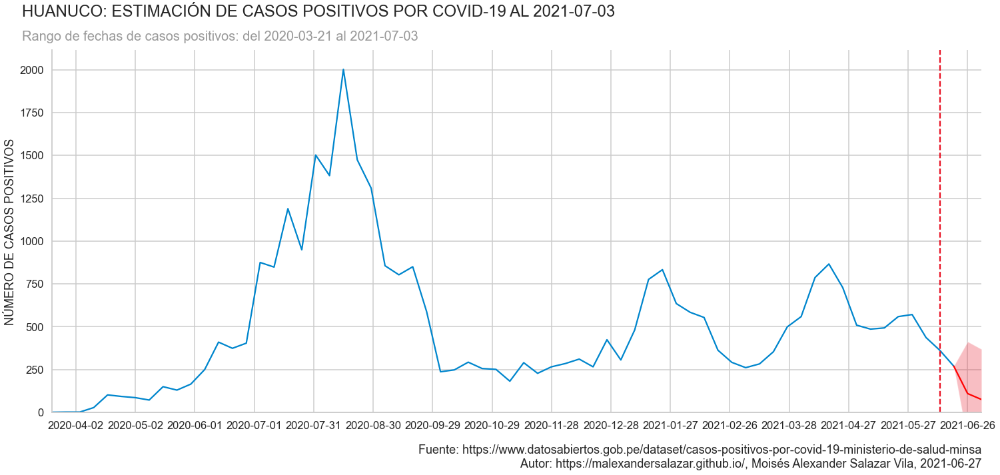

<Figure size 432x288 with 0 Axes>

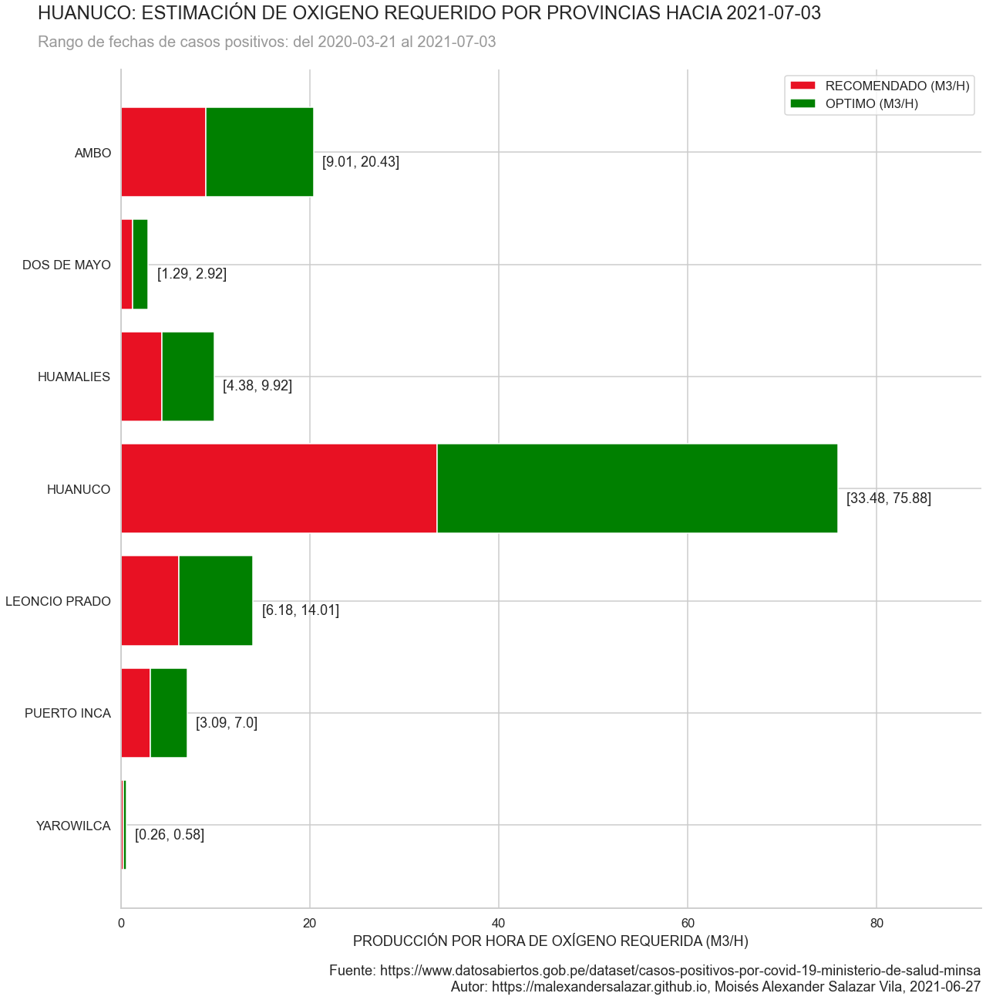

<Figure size 432x288 with 0 Axes>

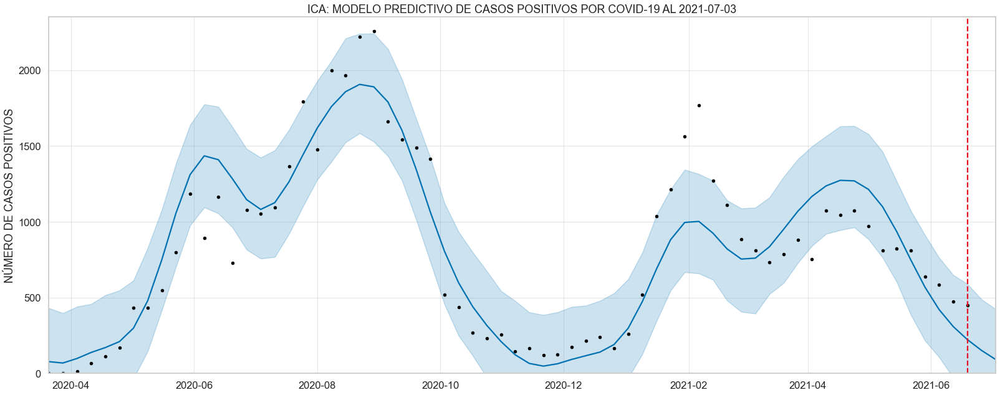

<Figure size 432x288 with 0 Axes>

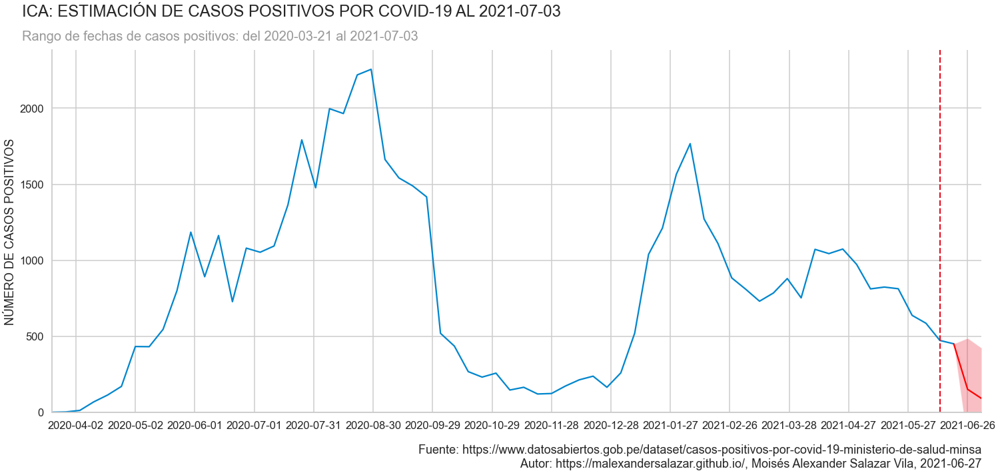

<Figure size 432x288 with 0 Axes>

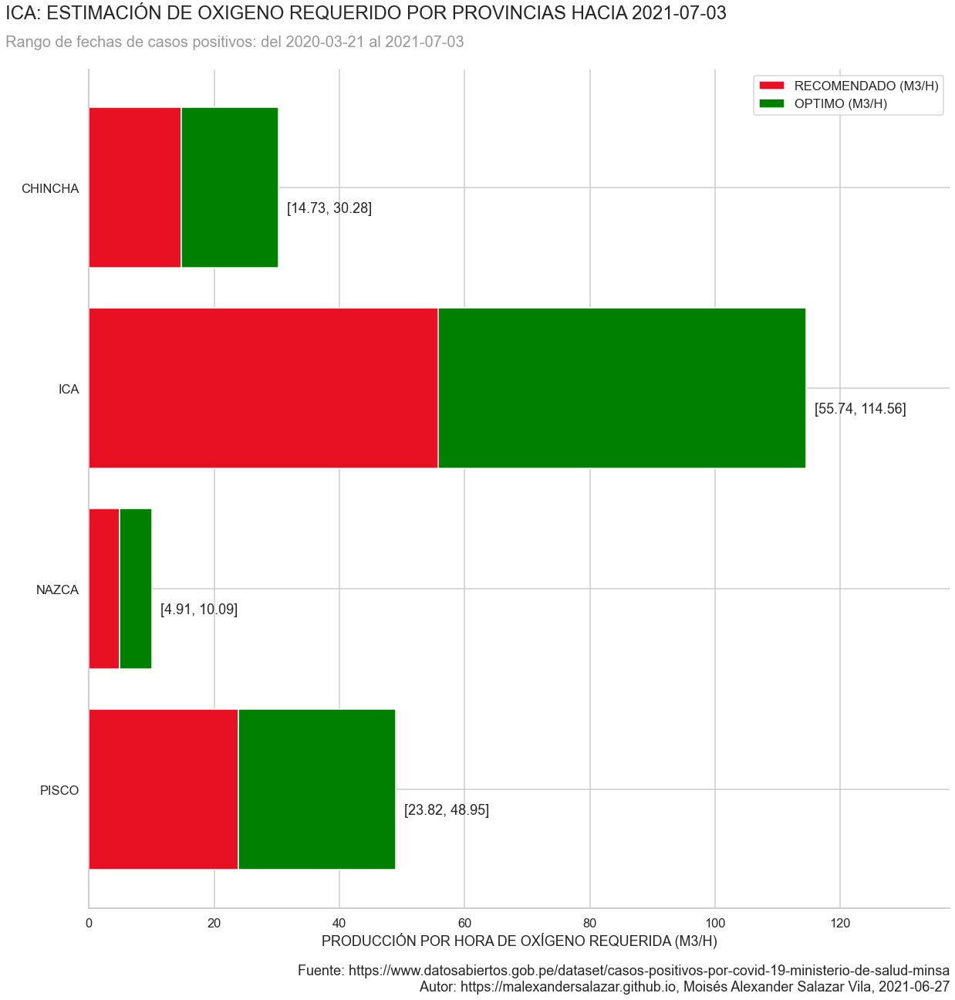

<Figure size 432x288 with 0 Axes>

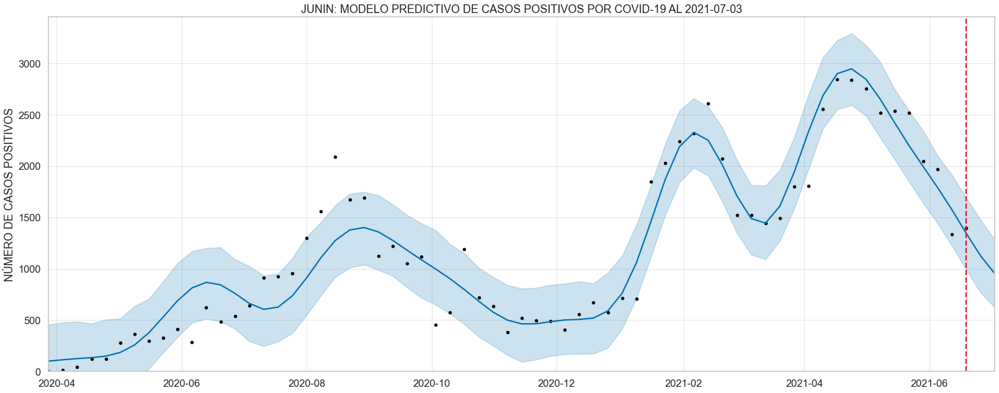

<Figure size 432x288 with 0 Axes>

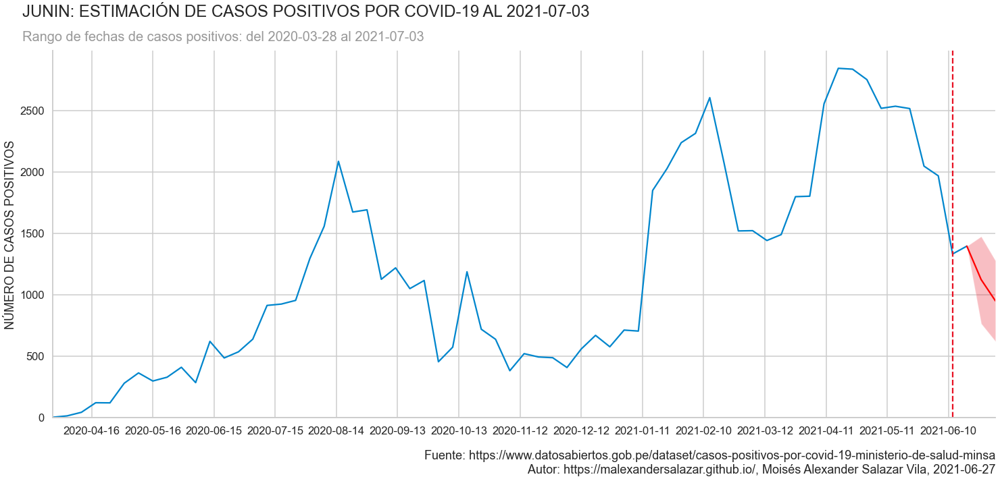

<Figure size 432x288 with 0 Axes>

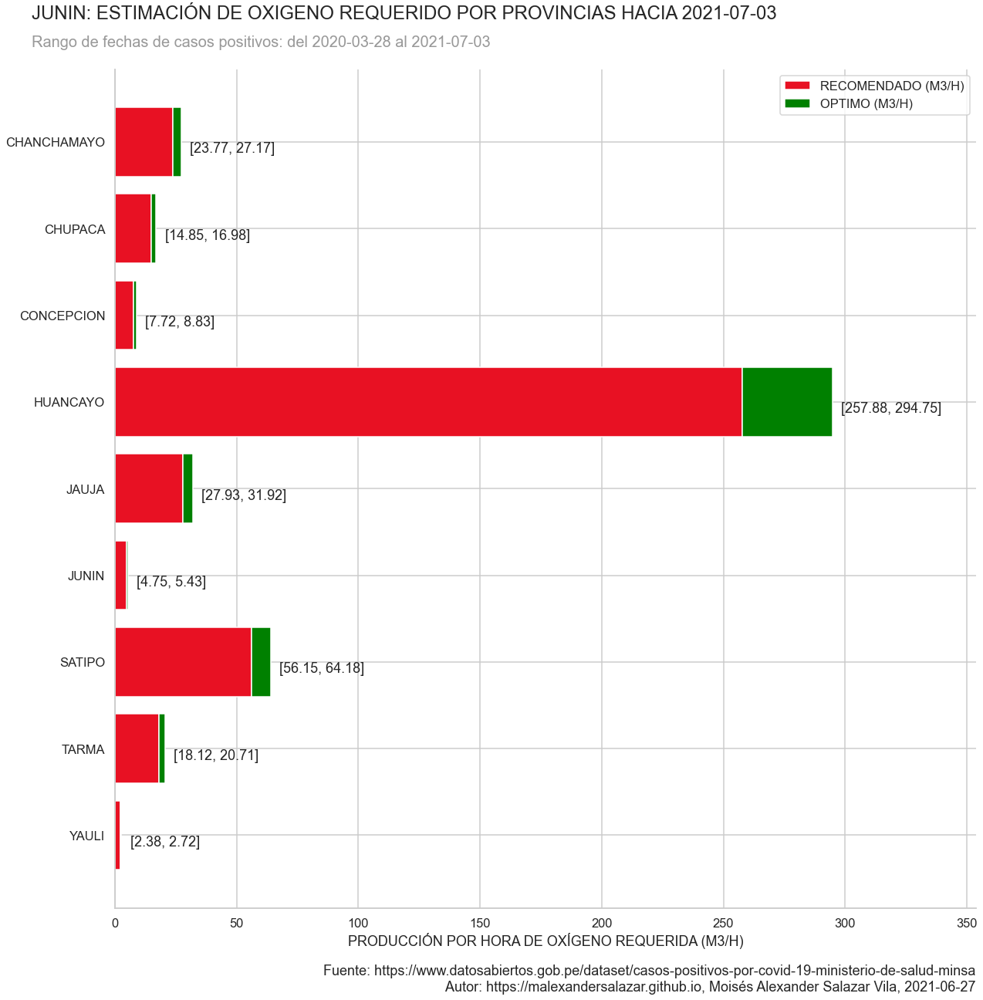

<Figure size 432x288 with 0 Axes>

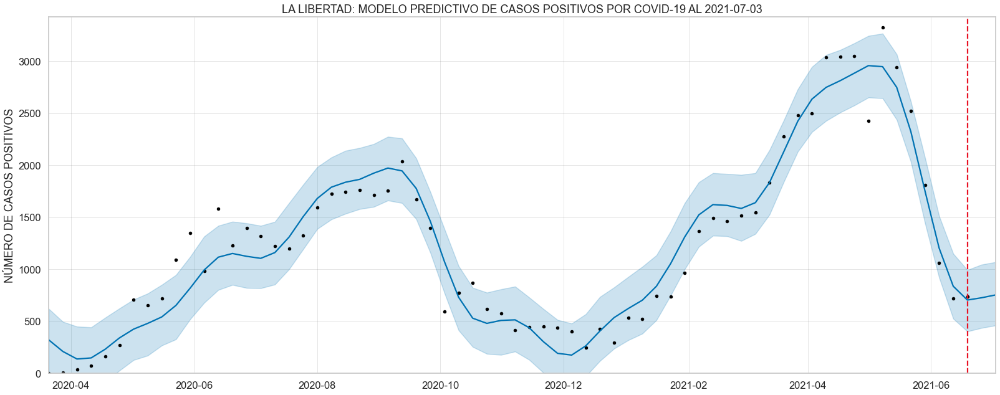

<Figure size 432x288 with 0 Axes>

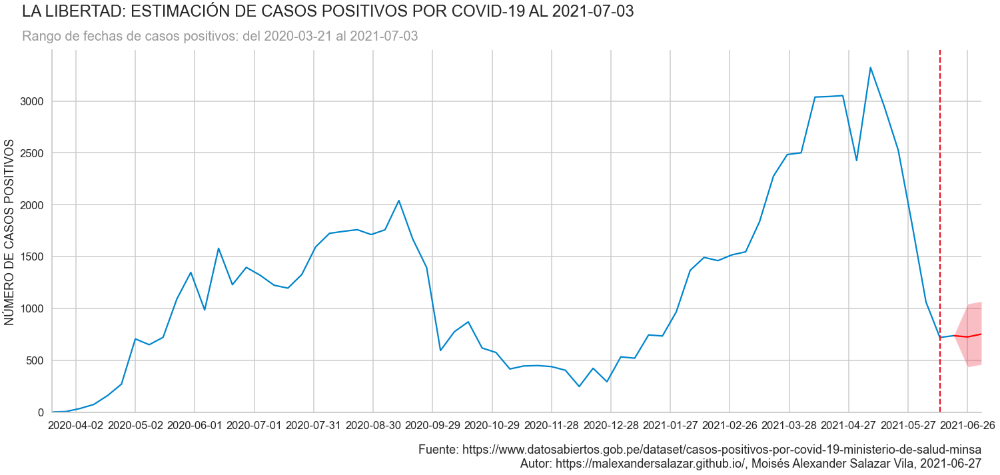

<Figure size 432x288 with 0 Axes>

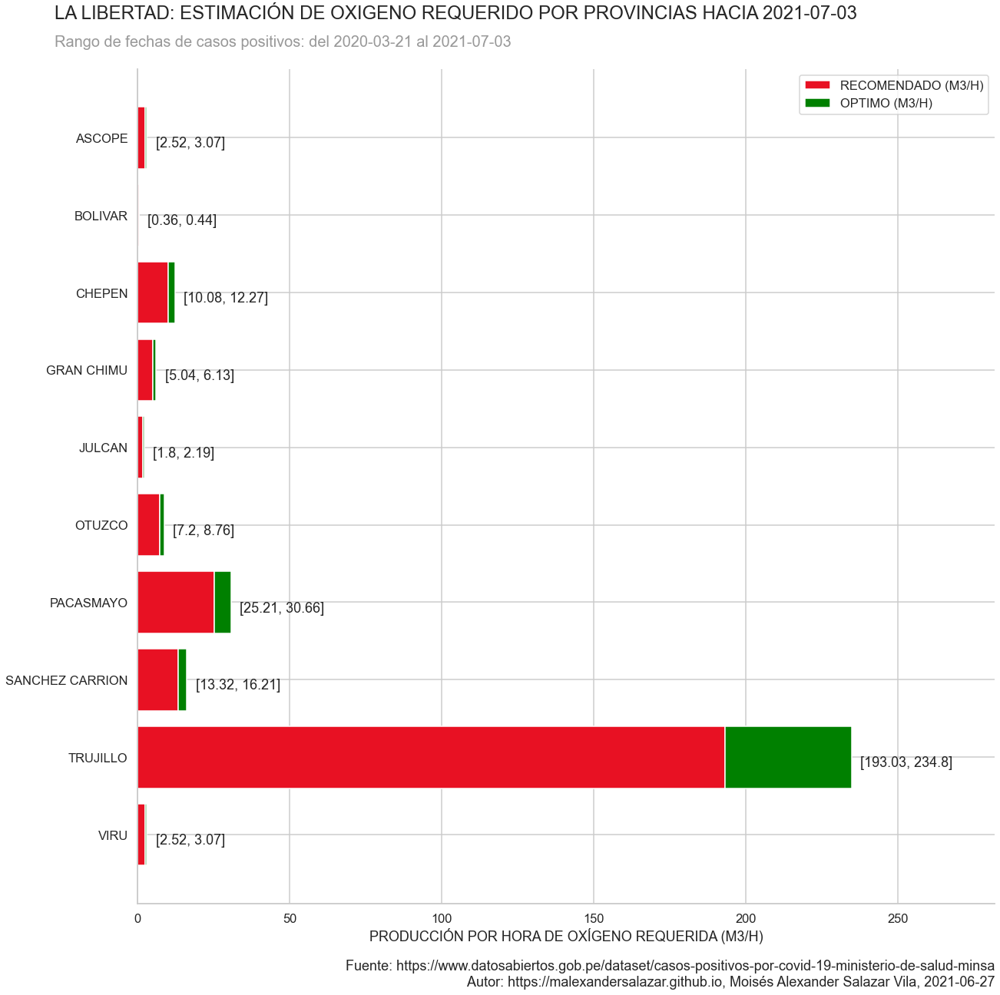

<Figure size 432x288 with 0 Axes>

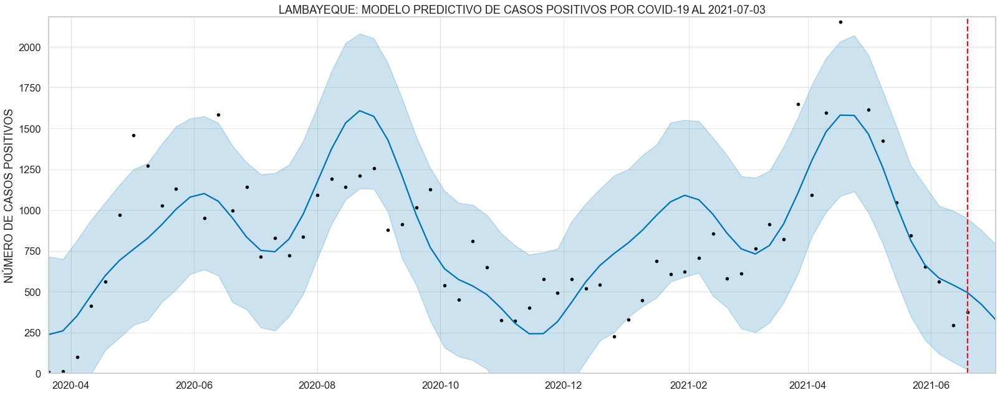

<Figure size 432x288 with 0 Axes>

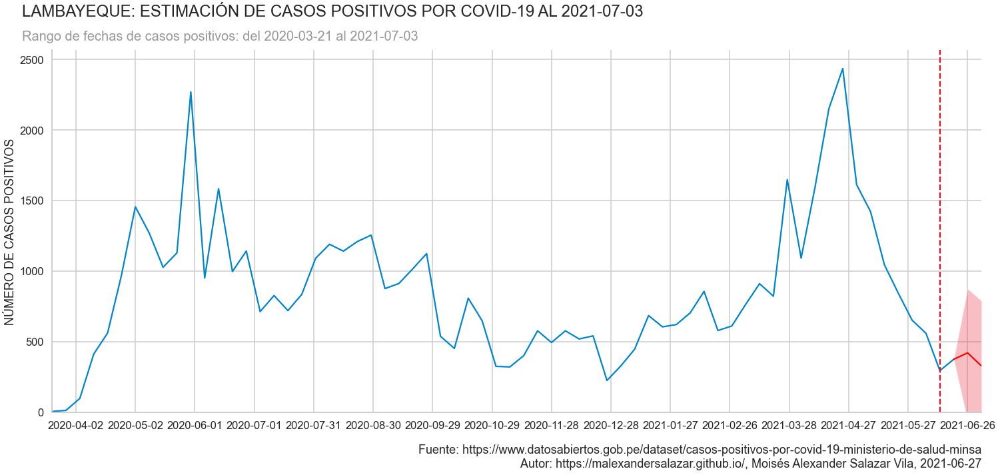

<Figure size 432x288 with 0 Axes>

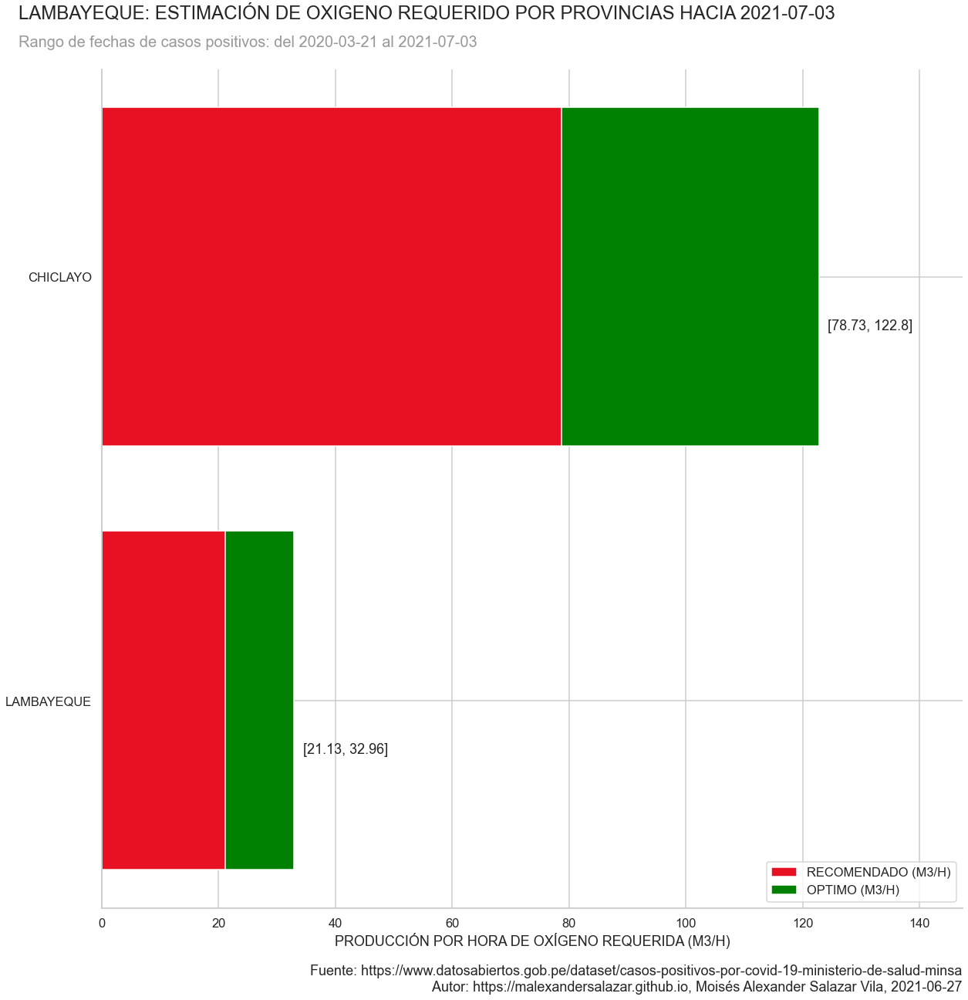

<Figure size 432x288 with 0 Axes>

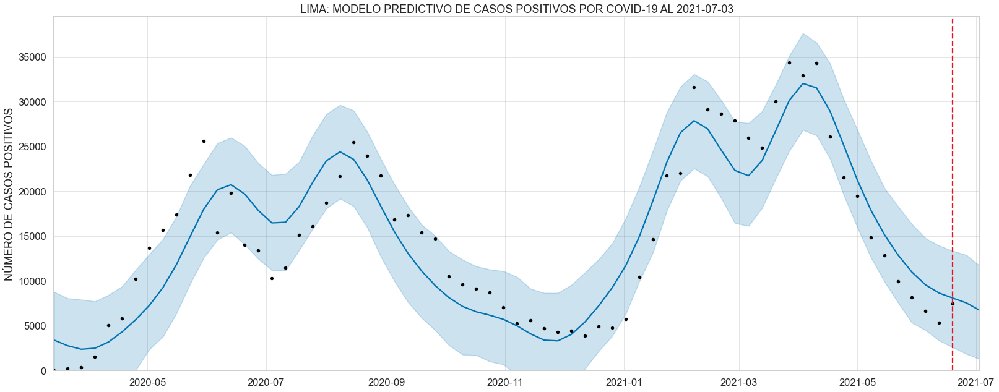

<Figure size 432x288 with 0 Axes>

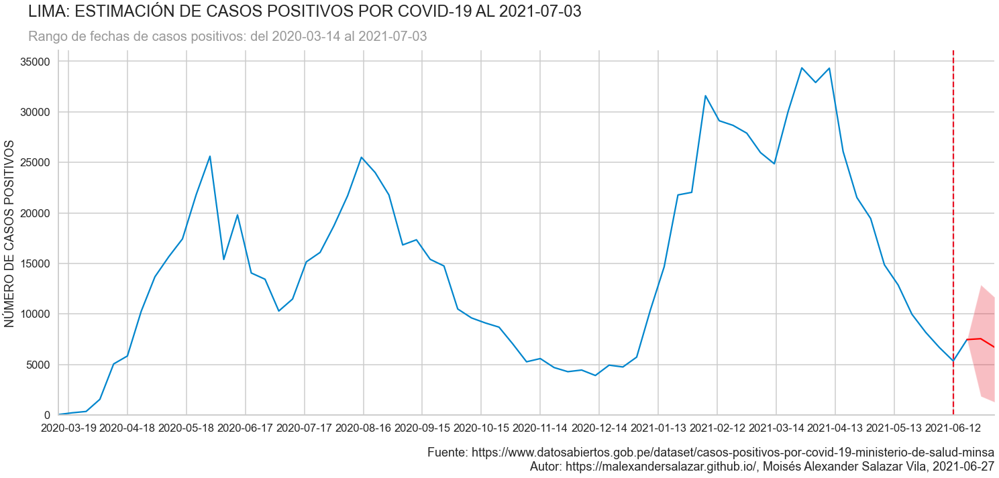

<Figure size 432x288 with 0 Axes>

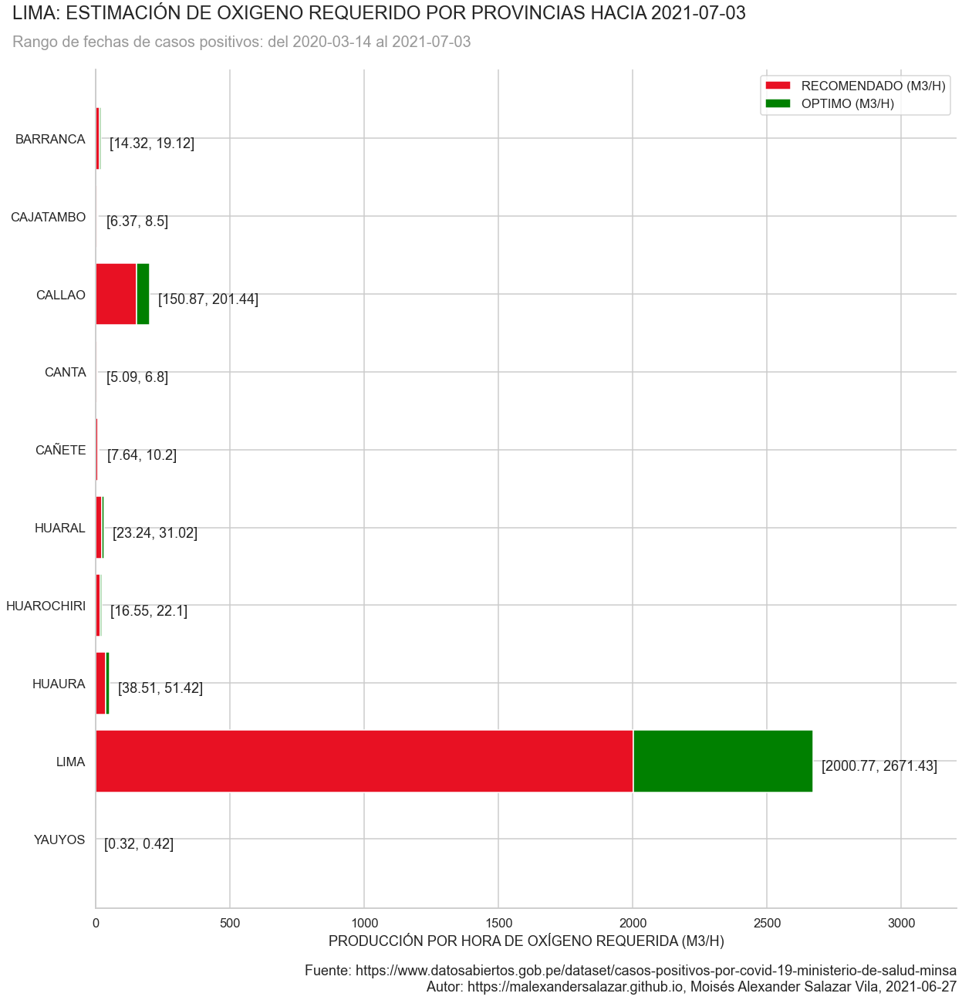

<Figure size 432x288 with 0 Axes>

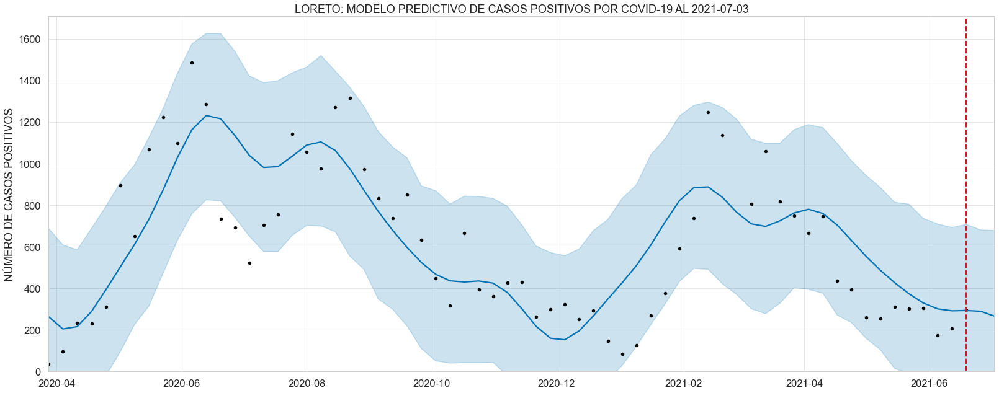

<Figure size 432x288 with 0 Axes>

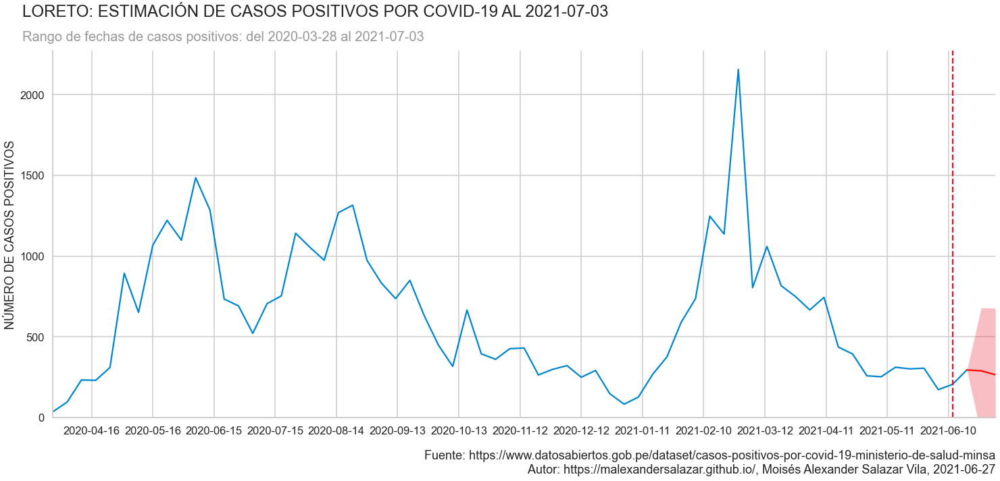

<Figure size 432x288 with 0 Axes>

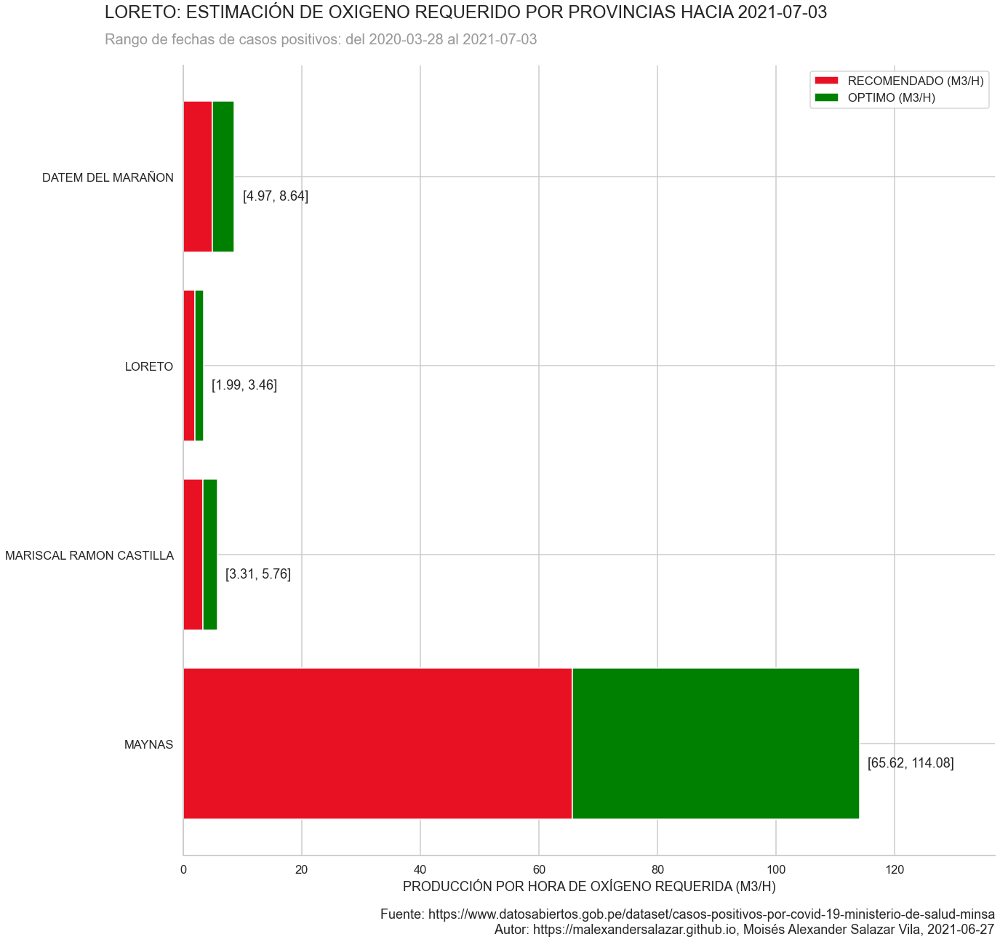

<Figure size 432x288 with 0 Axes>

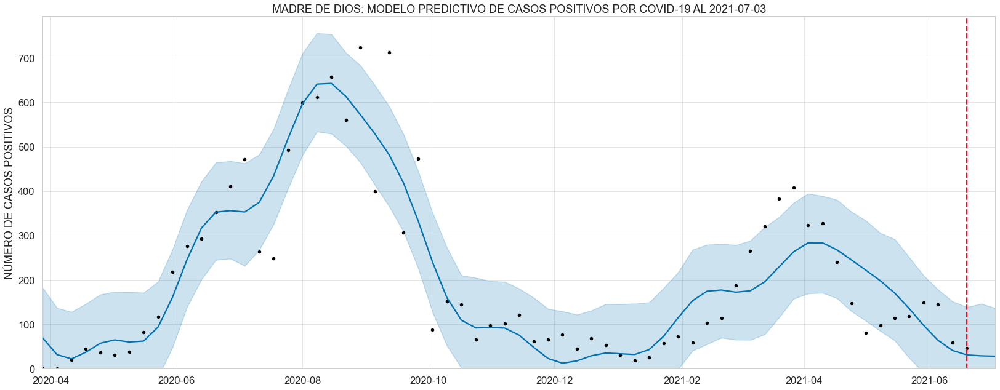

<Figure size 432x288 with 0 Axes>

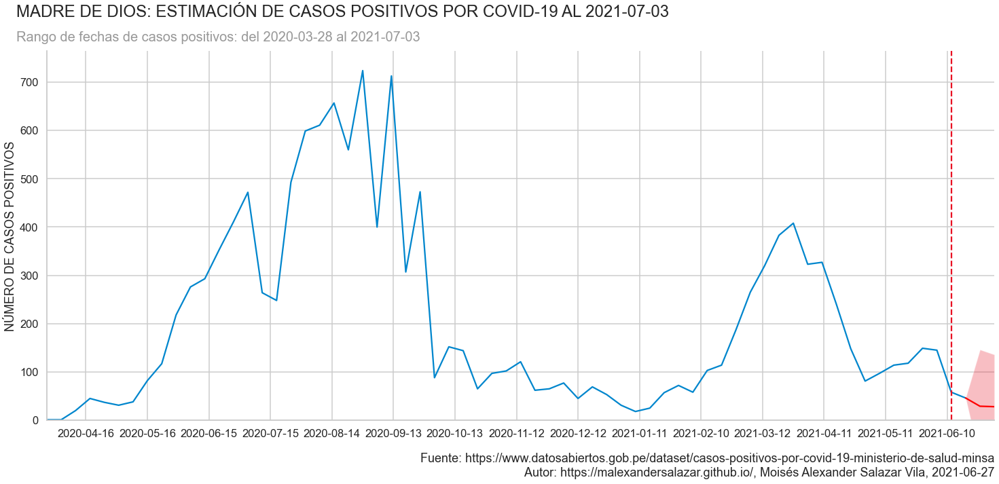

<Figure size 432x288 with 0 Axes>

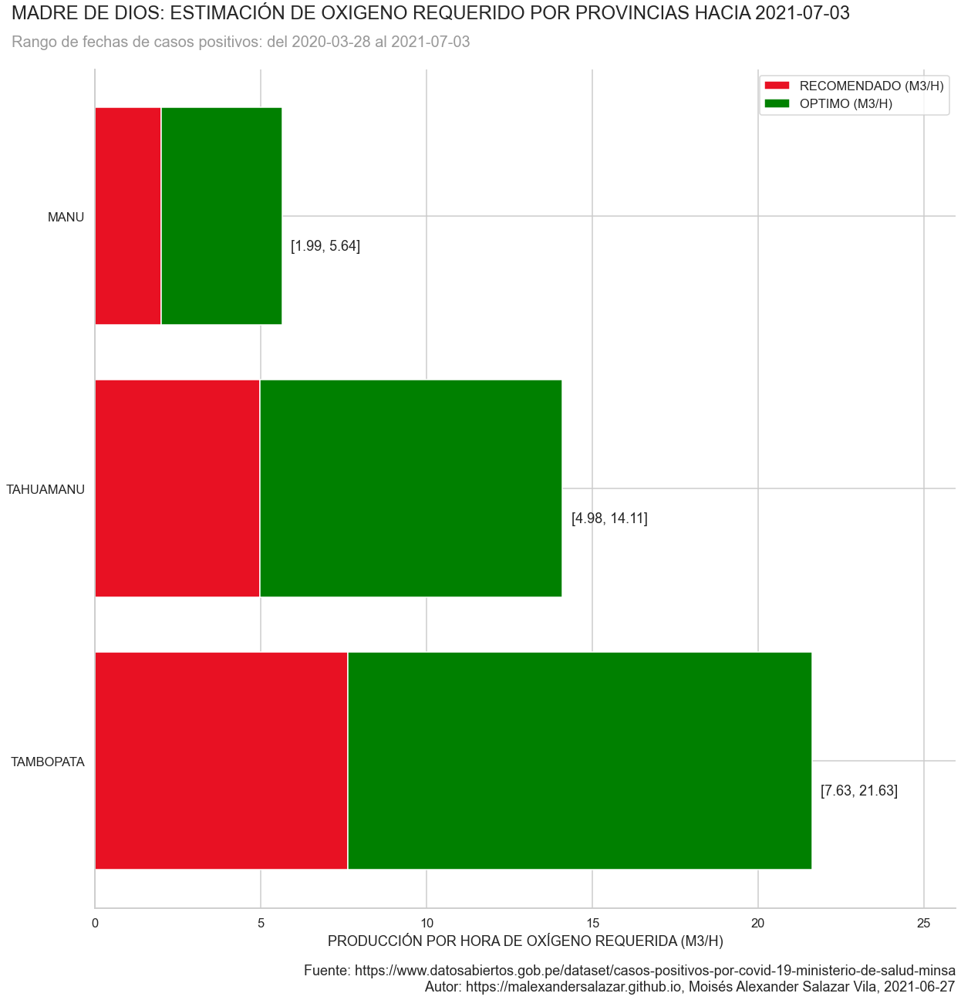

<Figure size 432x288 with 0 Axes>

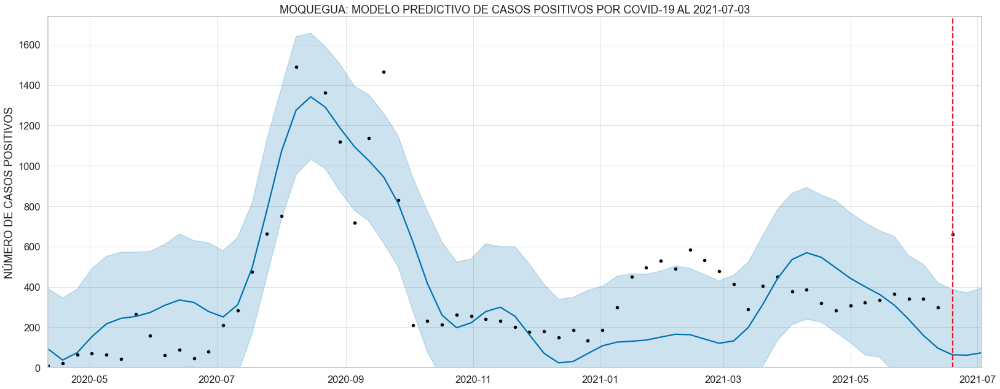

<Figure size 432x288 with 0 Axes>

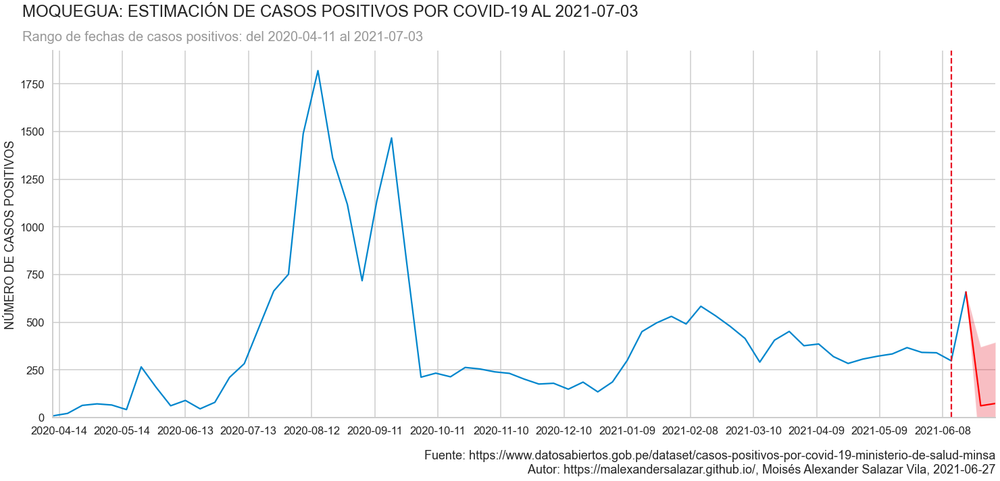

<Figure size 432x288 with 0 Axes>

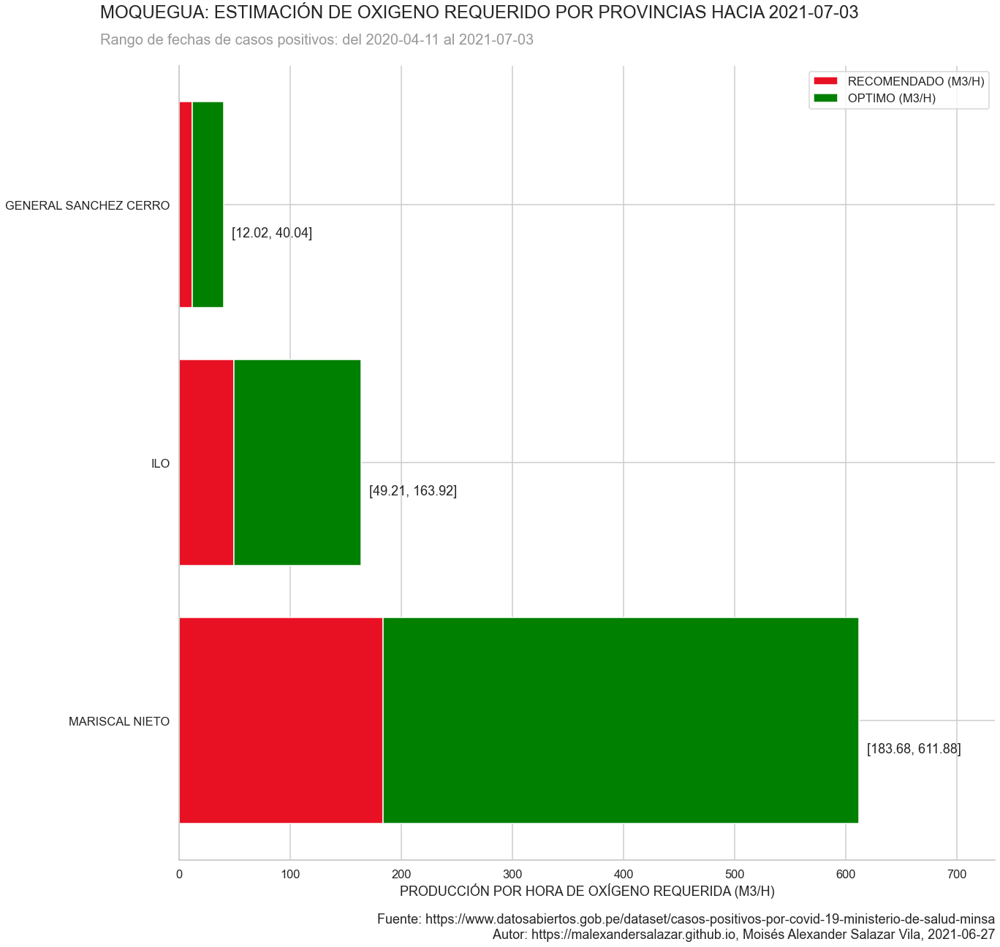

<Figure size 432x288 with 0 Axes>

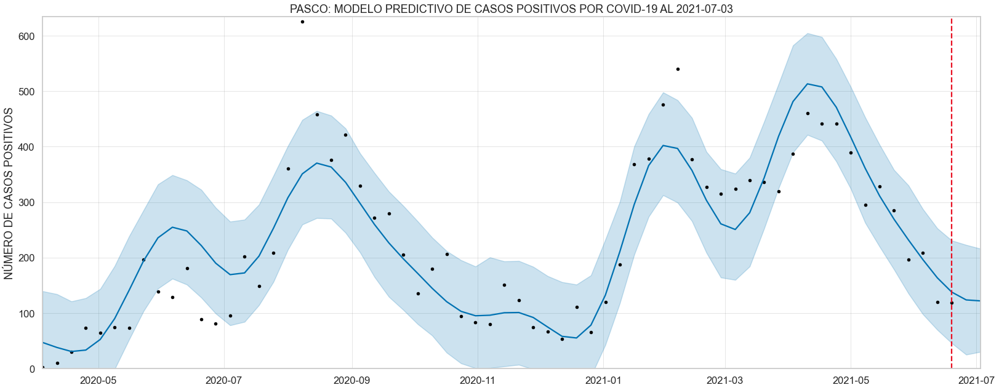

<Figure size 432x288 with 0 Axes>

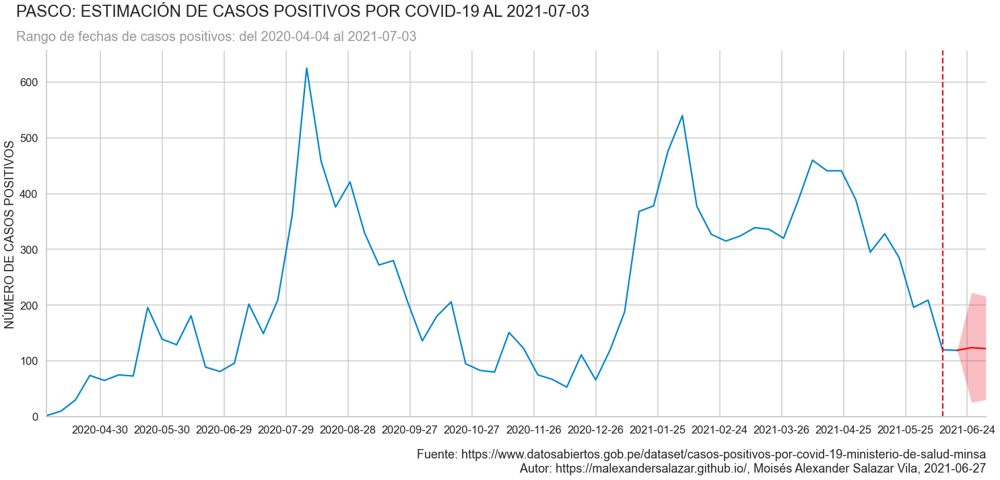

<Figure size 432x288 with 0 Axes>

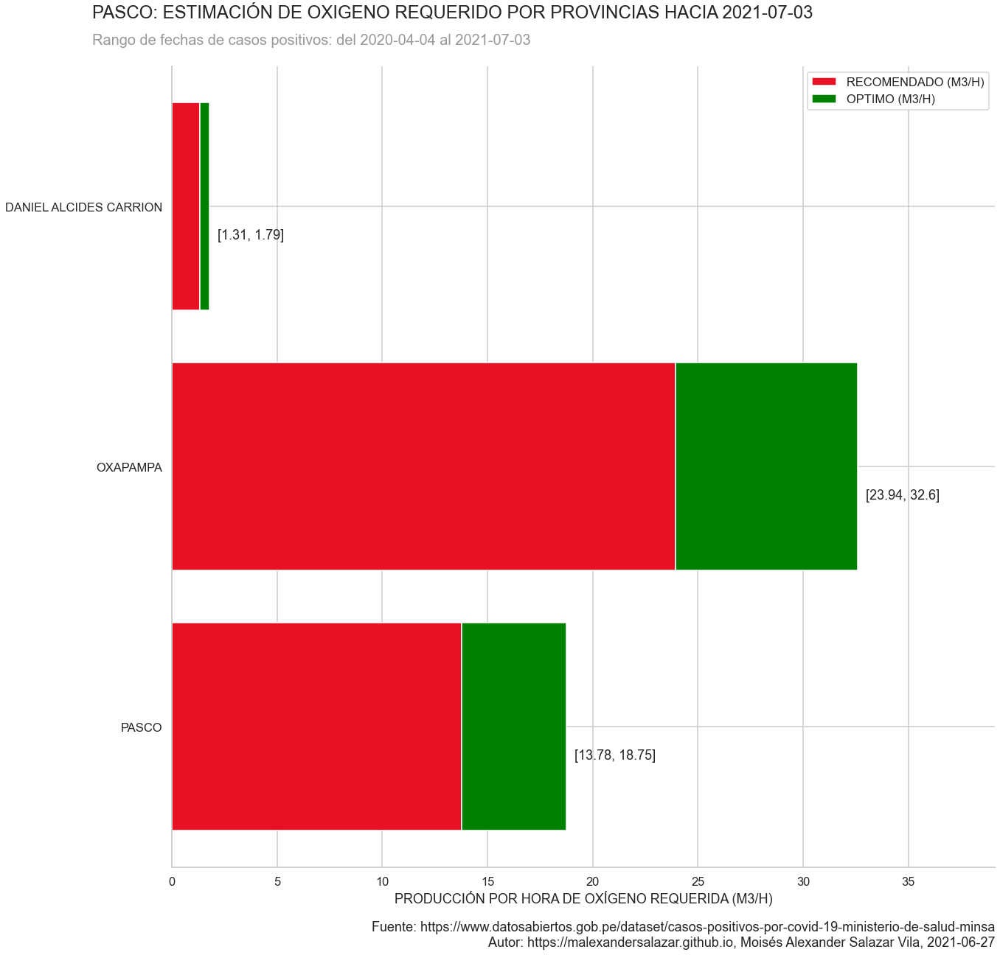

<Figure size 432x288 with 0 Axes>

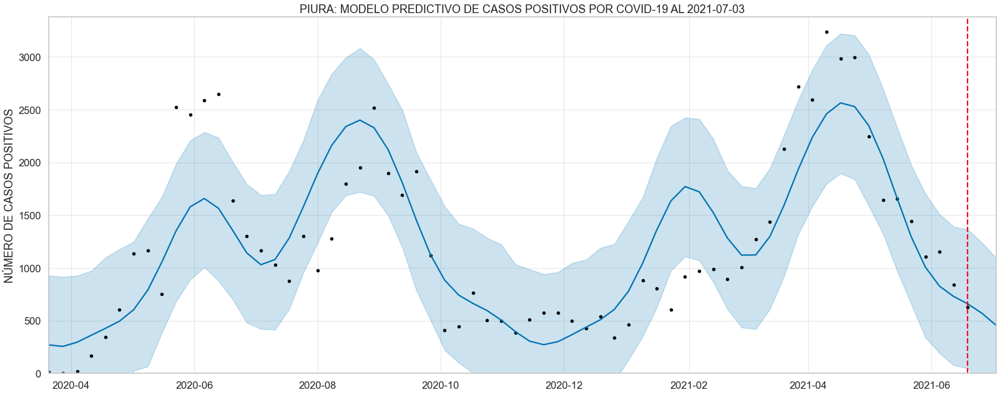

<Figure size 432x288 with 0 Axes>

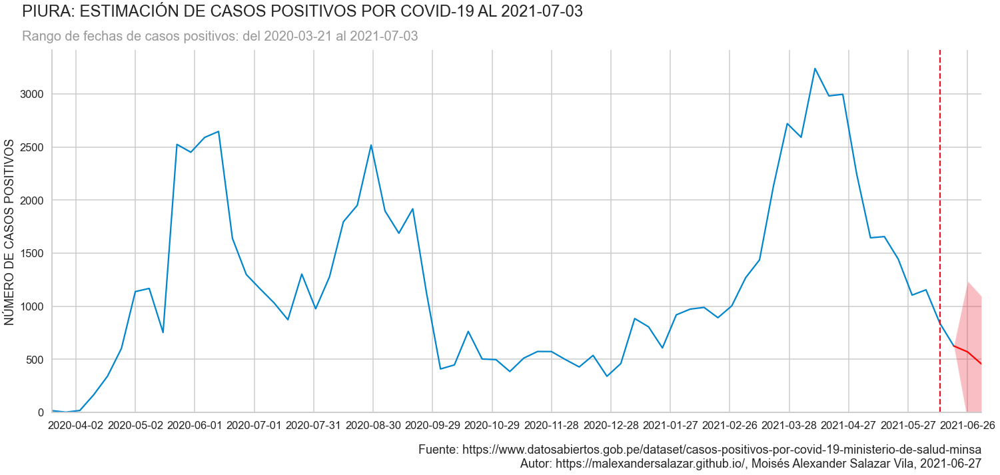

<Figure size 432x288 with 0 Axes>

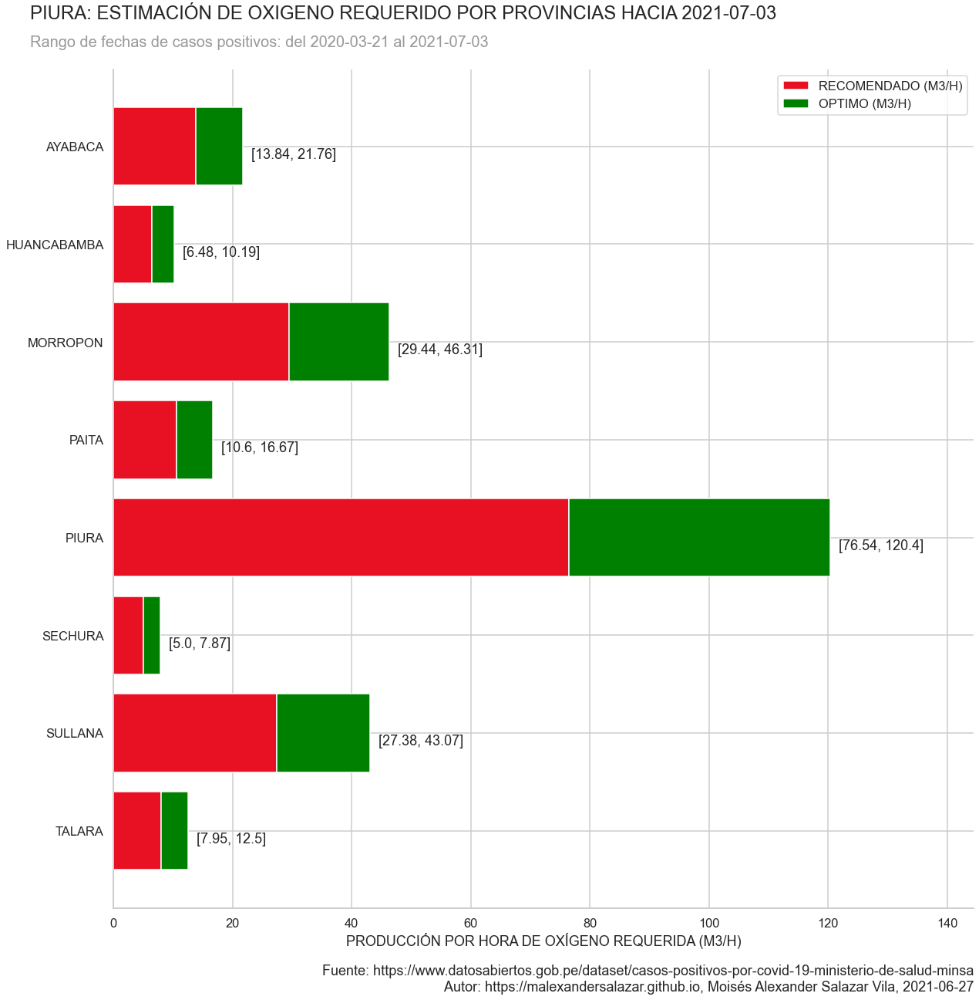

<Figure size 432x288 with 0 Axes>

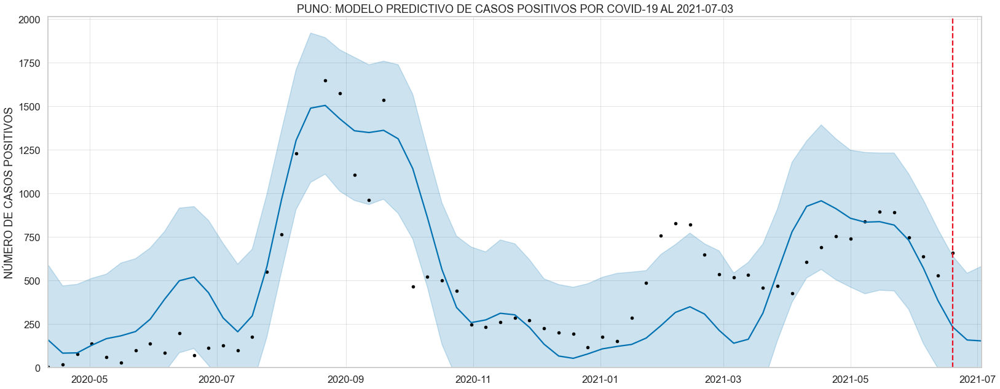

<Figure size 432x288 with 0 Axes>

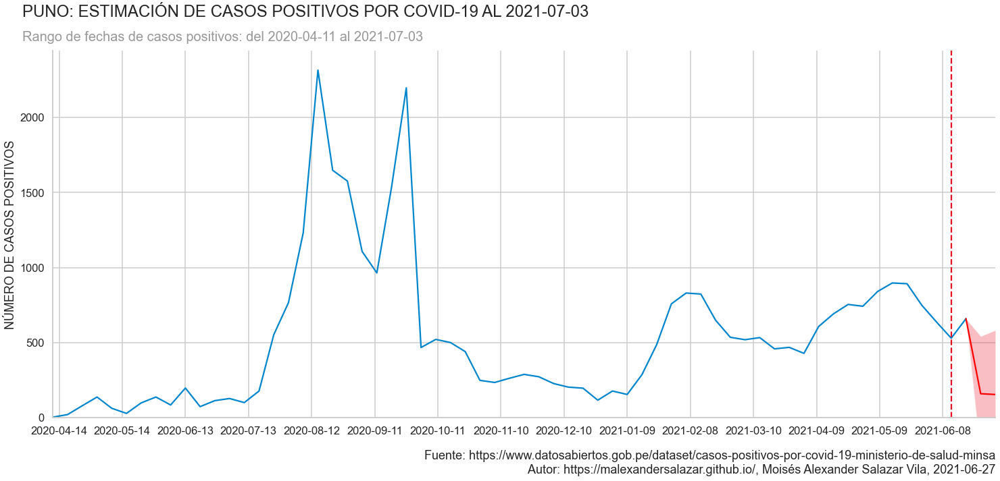

<Figure size 432x288 with 0 Axes>

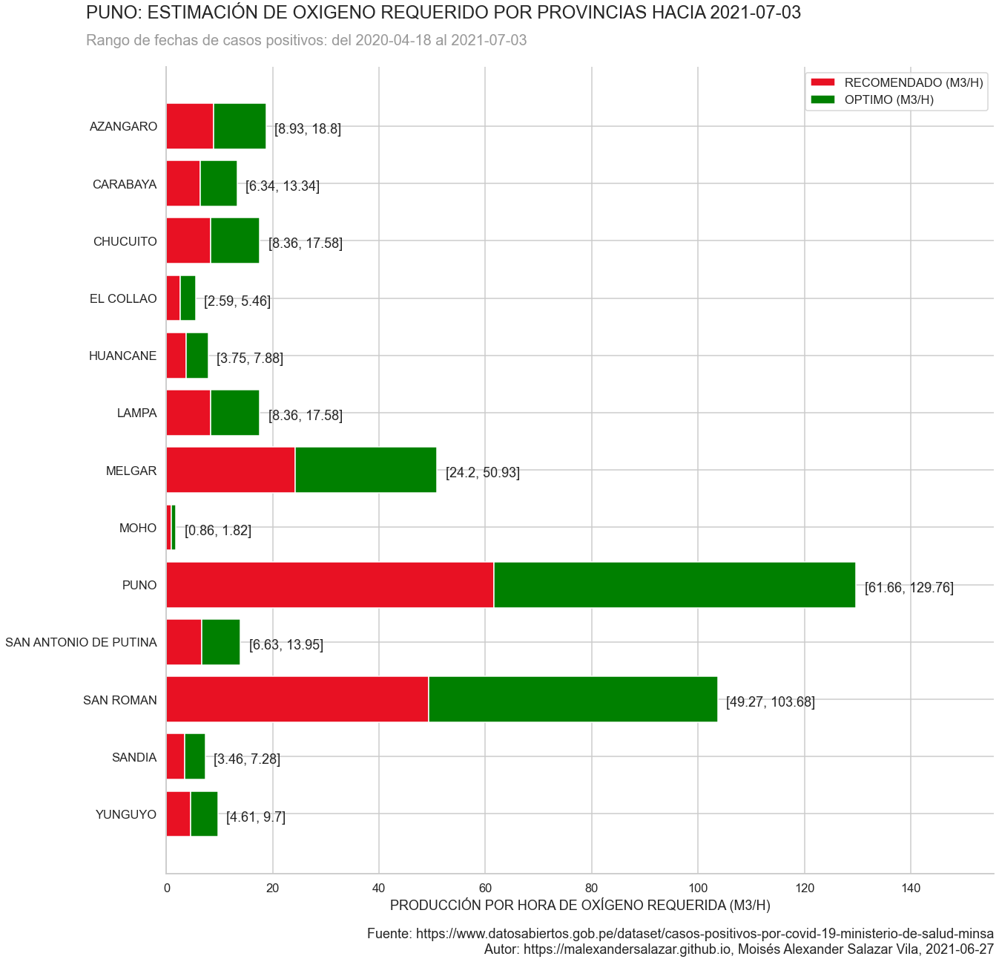

<Figure size 432x288 with 0 Axes>

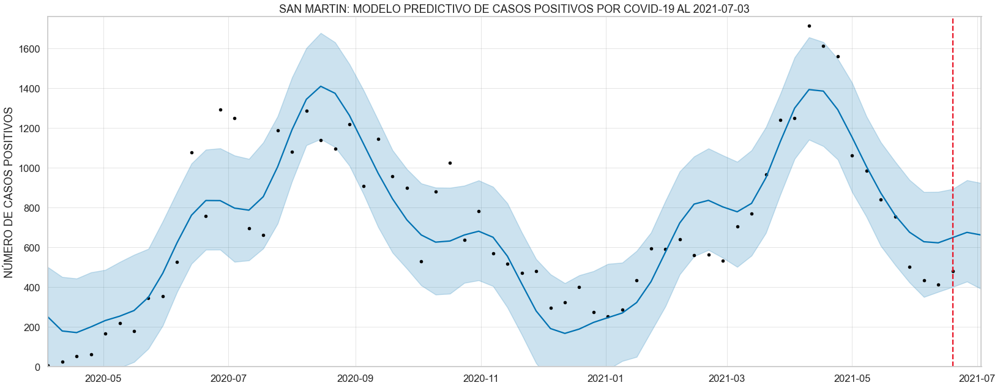

<Figure size 432x288 with 0 Axes>

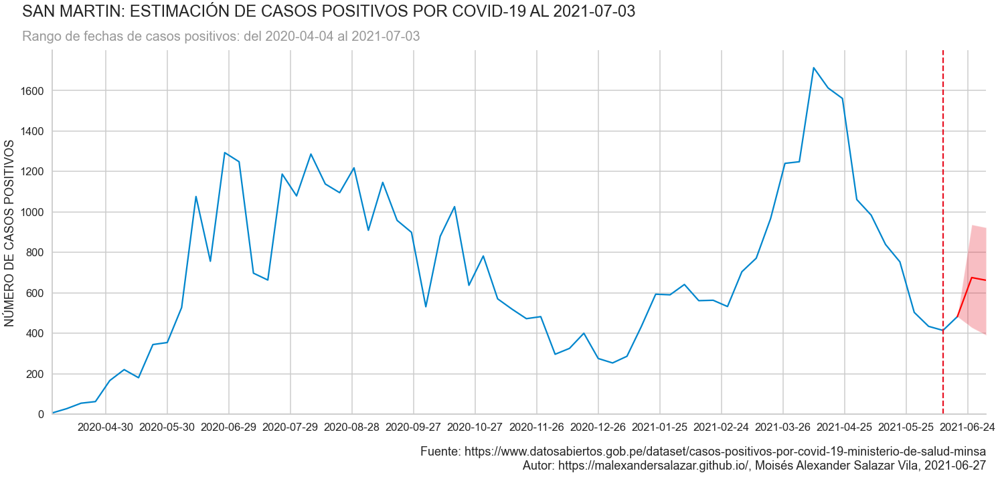

<Figure size 432x288 with 0 Axes>

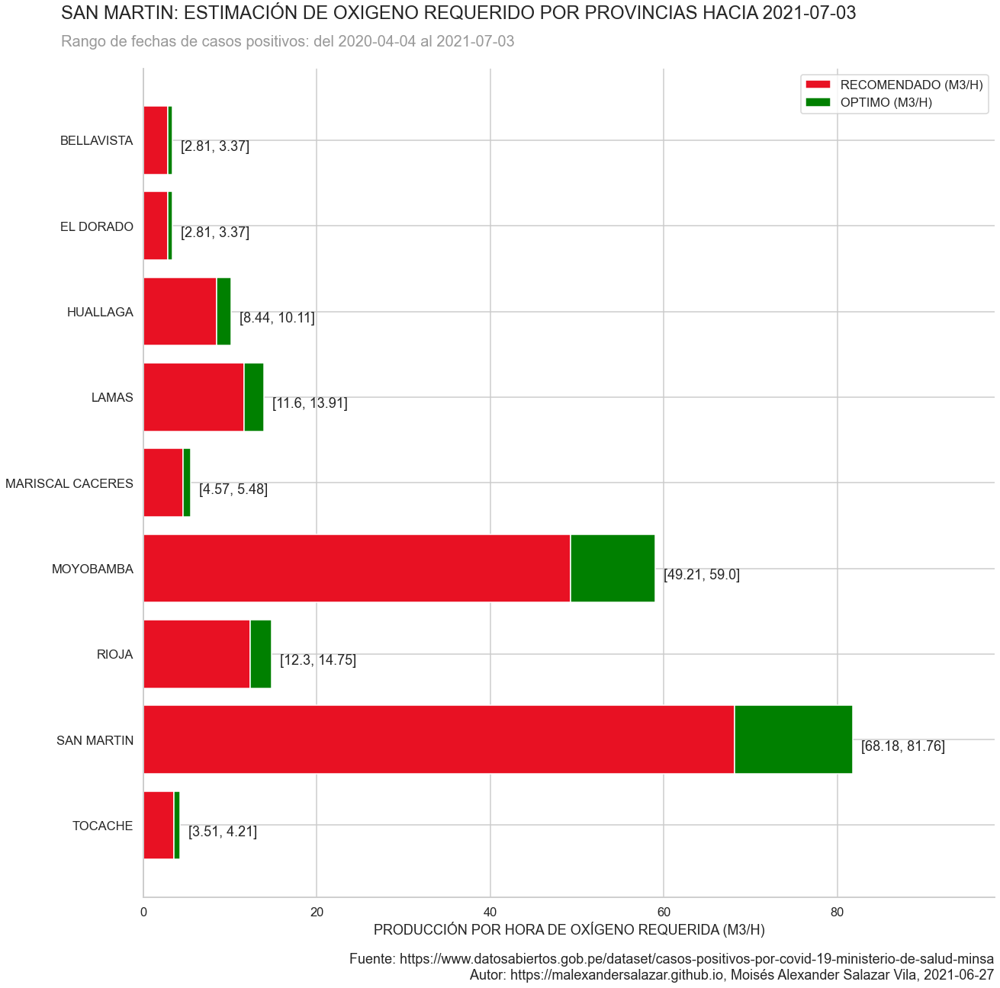

<Figure size 432x288 with 0 Axes>

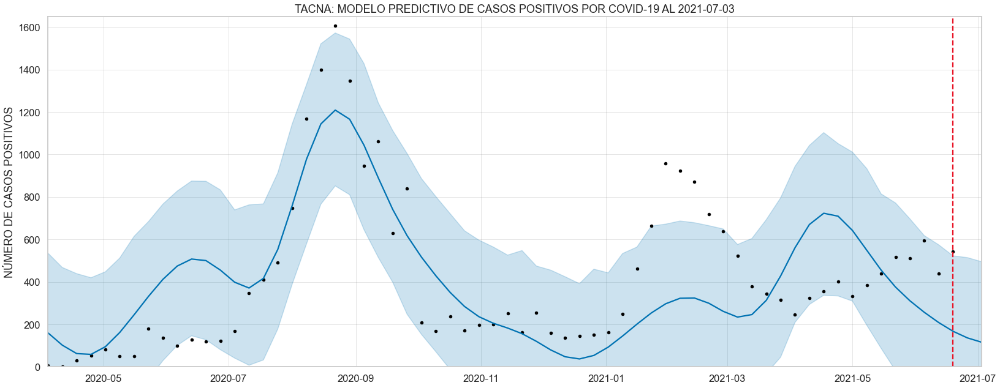

<Figure size 432x288 with 0 Axes>

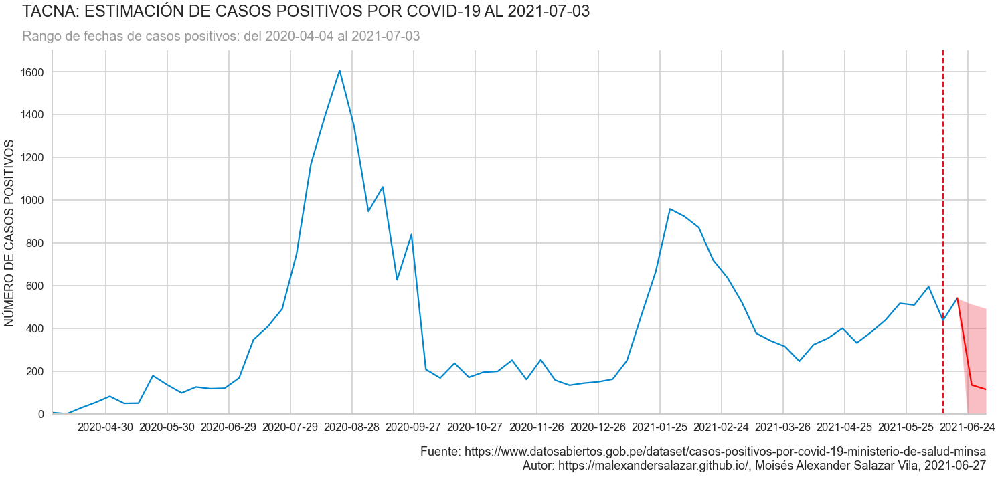

<Figure size 432x288 with 0 Axes>

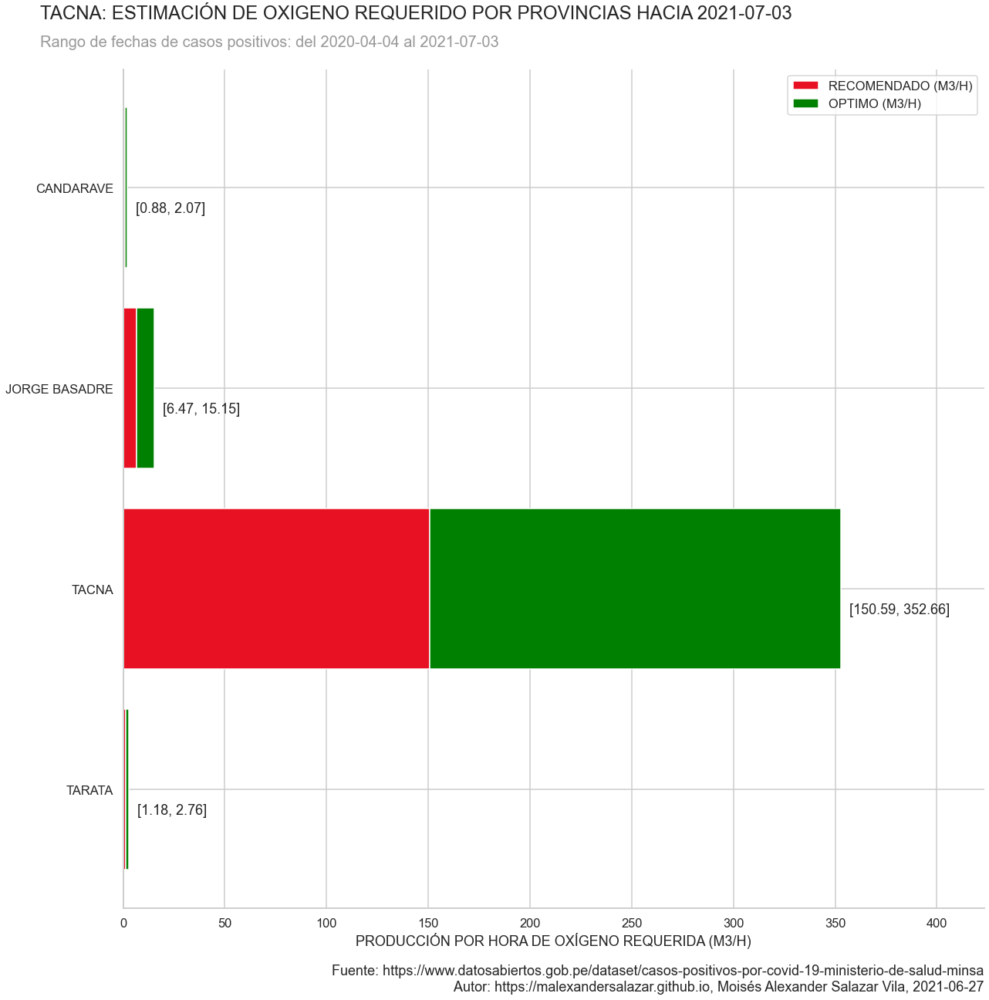

<Figure size 432x288 with 0 Axes>

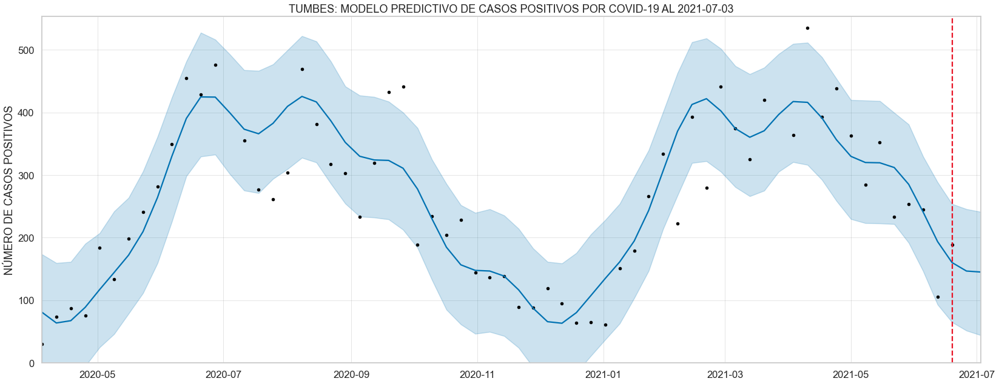

<Figure size 432x288 with 0 Axes>

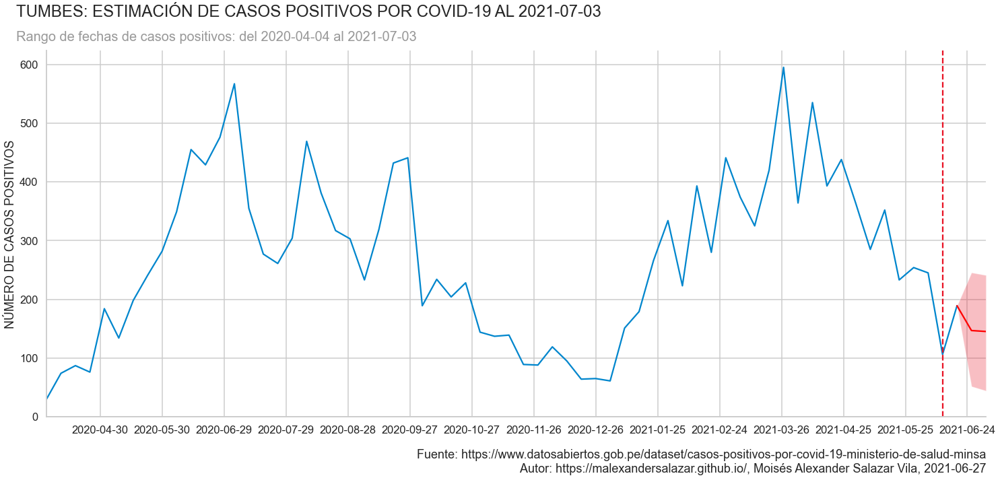

<Figure size 432x288 with 0 Axes>

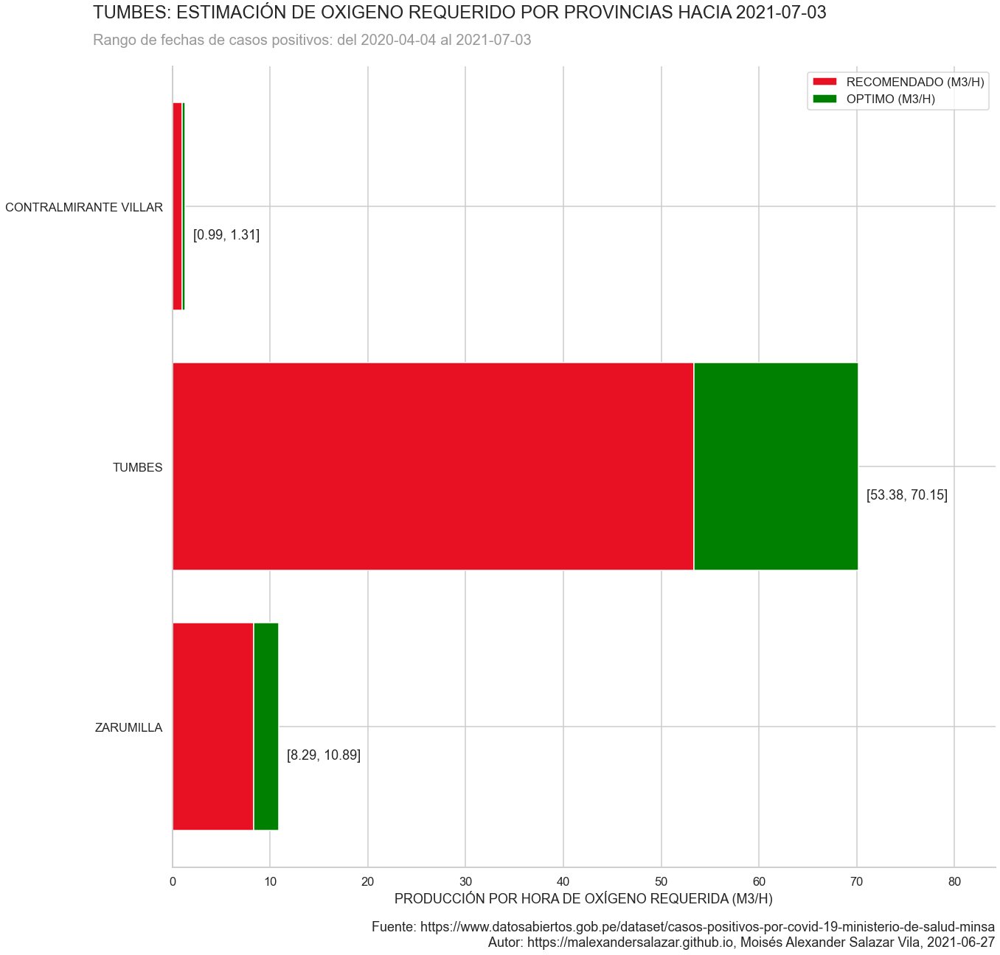

<Figure size 432x288 with 0 Axes>

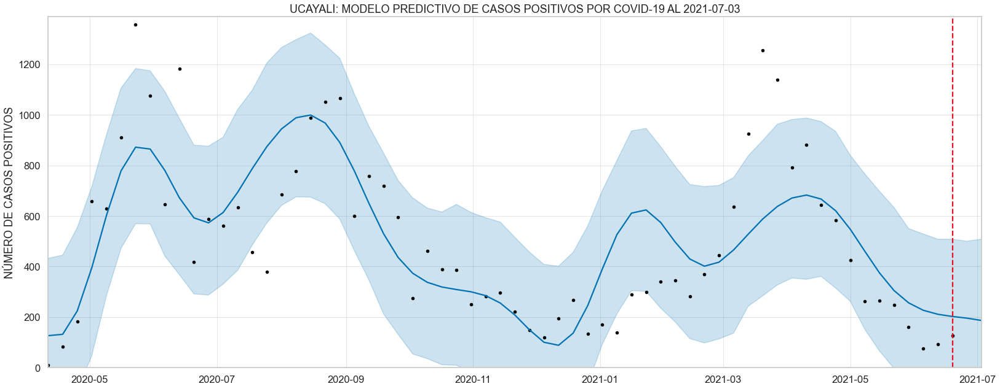

<Figure size 432x288 with 0 Axes>

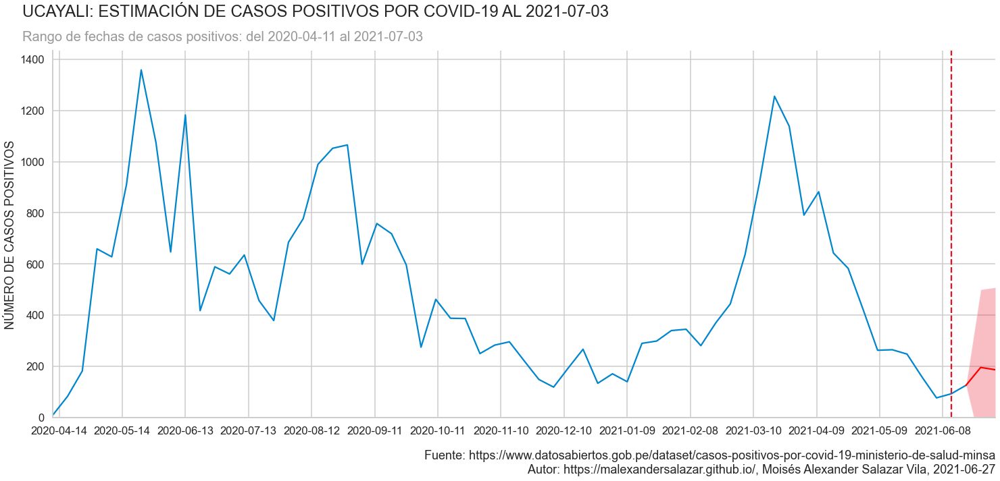

<Figure size 432x288 with 0 Axes>

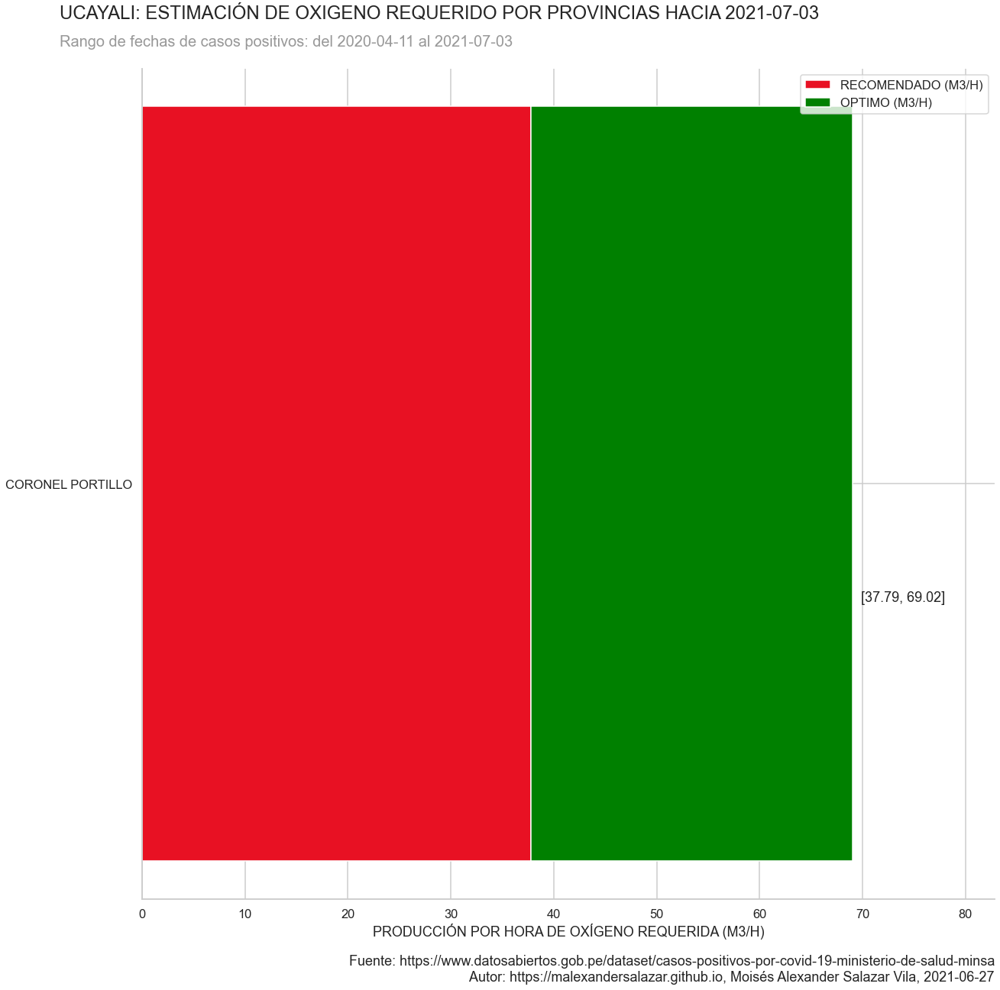

<Figure size 432x288 with 0 Axes>

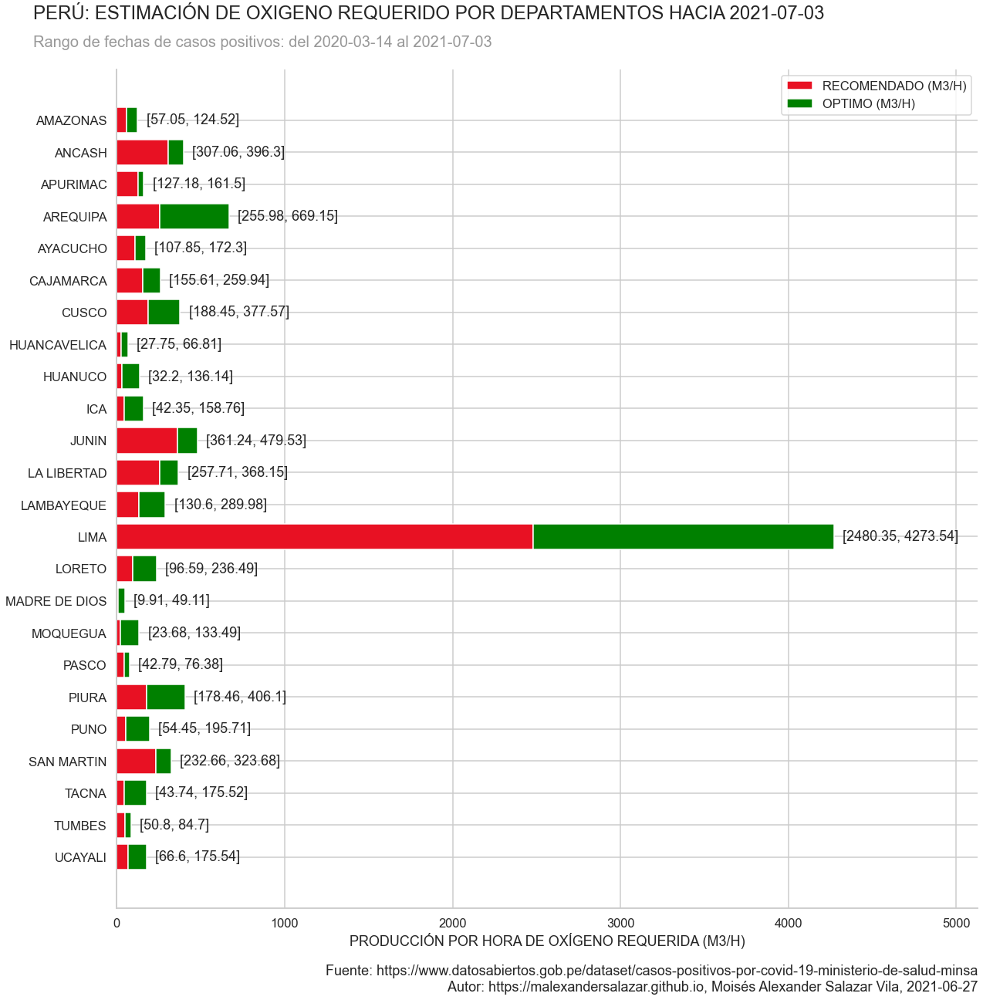

In [168]:
dept_list = []

dept_gb = df.groupby('DEPARTAMENTO')
for dept_group in dept_gb:
    dept_result = calculate_expected_os(dept_group[0],dept_group[1],f'PERÚ_{dept_group[0].replace(" ", "")}', True)
    dept_list.append({ 'AREA': dept_group[0], 'FECHA INICIO': dept_result[0], 'FECHA PRONÓSTICO': dept_result[1], 'PROD. RECOMENDADA': max(0,dept_result[2]), 'PROD. IDEAL': max(0,dept_result[3]) })

    ratio_recommended = dept_result[4]
    ratio_ideal = dept_result[5]

    prov_list = []
    prov_gb = dept_group[1].groupby('PROVINCIA')

    for prov_group in prov_gb:
        if(prov_group[0] == 'EN INVESTIGACIÓN'):
            continue

        prov_group_weekly_df = generate_weekly_dataframe(prov_group[1])
        last_infected_count = prov_group_weekly_df['y'].iloc[-1]

        prov_start_date = prov_group_weekly_df['ds'].iloc[0]
        prov_end_date = prov_group_weekly_df['ds'].iloc[-1] + np.timedelta64(FUTURE_PERIODS*7,'D')

        if(prov_end_date != dept_result[1]):
            continue

        recommended_cases = last_infected_count + last_infected_count * ratio_recommended
        recommended_severe_cases = recommended_cases * 0.14
        recommended_critical_cases = recommended_cases * 0.05
        recommended_subtotal_severe = recommended_severe_cases * AVG_O2_FLOW_RATE_SEVERE * 60 # L/h
        recommended_subtotal_critical = recommended_critical_cases * AVG_O2_FLOW_RATE_CRITICAL * 60 # L/h

        ideal_cases = last_infected_count + last_infected_count * ratio_ideal
        ideal_severe_cases = ideal_cases * 0.14
        ideal_critical_cases = ideal_cases * 0.05
        ideal_subtotal_severe = ideal_severe_cases * AVG_O2_FLOW_RATE_SEVERE * 60 # L/h
        ideal_subtotal_critical = ideal_critical_cases * AVG_O2_FLOW_RATE_CRITICAL * 60 # L/h

        prov_list.append({ 'AREA': prov_group[0], 'FECHA INICIO': prov_start_date, 'FECHA PRONÓSTICO': prov_end_date, 'PROD. RECOMENDADA': (recommended_subtotal_severe + recommended_subtotal_critical) * LITERS_TO_CUBICMETERS, 'PROD. IDEAL': (ideal_subtotal_severe + ideal_subtotal_critical) * LITERS_TO_CUBICMETERS })

    province_df = pd.DataFrame(prov_list, columns=('AREA','FECHA INICIO','FECHA PRONÓSTICO','PROD. RECOMENDADA','PROD. IDEAL'))
    input_df = province_df.sort_values('AREA', ascending=False, inplace=False)

    with open("../dist/md_forecast.txt", "a", encoding='utf-8') as f:
        md_df = input_df[['AREA','FECHA PRONÓSTICO', 'PROD. RECOMENDADA', 'PROD. IDEAL']].copy()
        md_df.columns = 'PROVINCIA','FECHA PRONÓSTICO', 'PROD. RECOMENDADA', 'PROD. IDEAL'
        md_df['FECHA PRONÓSTICO'] = md_df['FECHA PRONÓSTICO'].dt.strftime('%Y-%m-%d')
        md_df.sort_values('PROVINCIA', ascending=True, inplace=True)
        f.write(md_df.to_markdown(index=False) + '\n\n')

    generate_bar_plot(dept_group[0], 'PROVINCIAS', input_df, (input_df['FECHA INICIO'].min(), input_df['FECHA PRONÓSTICO'].max()), show_plot=True, save_plot=True)

department_df = pd.DataFrame(dept_list, columns=('AREA','FECHA INICIO','FECHA PRONÓSTICO','PROD. RECOMENDADA','PROD. IDEAL'))
input_df = department_df.sort_values('AREA', ascending=False, inplace=False)

with open("../dist/md_forecast.txt", "a", encoding='utf-8') as f:
    md_df = input_df[['AREA','FECHA PRONÓSTICO', 'PROD. RECOMENDADA', 'PROD. IDEAL']].copy()
    md_df.columns = 'DEPARTAMENTO','FECHA PRONÓSTICO', 'PROD. RECOMENDADA', 'PROD. IDEAL'
    md_df['FECHA PRONÓSTICO'] = md_df['FECHA PRONÓSTICO'].dt.strftime('%Y-%m-%d')
    md_df.sort_values('DEPARTAMENTO', ascending=True, inplace=True)
    f.write(md_df.to_markdown(index=False) + '\n\n')

generate_bar_plot('PERÚ', 'DEPARTAMENTOS', input_df, (input_df['FECHA INICIO'].min(), input_df['FECHA PRONÓSTICO'].max()), show_plot=True, save_plot=True)